In [ ]:
%pip install copent

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR
from copent import transent

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.gaussian_process import GaussianProcessRegressor

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Embedding
from keras.callbacks import EarlyStopping, LearningRateScheduler
from keras.losses import MeanSquaredError, Huber
from keras.optimizers import Adam
from keras.metrics import MeanAbsoluteError

import torch
from torch import nn, optim

from itertools import product
import pickle as pkl
from tqdm.notebook import tqdm

%matplotlib inline

In [ ]:
strategy = tf.distribute.MirroredStrategy()

## Input Data

In [4]:
store_sales = pd.read_csv('../input/eco-dataset/train.csv', header=0, parse_dates=[0])
store_sales['date'] = pd.to_datetime(store_sales['date'])
store_sales = store_sales.set_index('id')

store_sales.head()

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0
3,2013-01-01,1,BEVERAGES,0.0,0
4,2013-01-01,1,BOOKS,0.0,0


### Data Preprocessing

In [5]:
store_sales = store_sales.drop(columns=['store_nbr', 'onpromotion'])
store_sales['family'] = store_sales['family'].str.replace(r'\s+', '_', regex=True)

store_sales.head(10)

,date,family,sales
id,,,
0,2013-01-01,AUTOMOTIVE,0.0
1,2013-01-01,BABY_CARE,0.0
2,2013-01-01,BEAUTY,0.0
3,2013-01-01,BEVERAGES,0.0
4,2013-01-01,BOOKS,0.0
5,2013-01-01,BREAD/BAKERY,0.0
6,2013-01-01,CELEBRATION,0.0
7,2013-01-01,CLEANING,0.0
8,2013-01-01,DAIRY,0.0


In [6]:
unique_families = store_sales['family'].unique()
family_dfs = {}

for family in unique_families:
    family_dfs[family] = store_sales[store_sales['family'] == family]

In [7]:
combined_df = pd.concat(family_dfs.values(), ignore_index=True)
pivot_df = combined_df.pivot_table(index='date', columns='family', values='sales', aggfunc='sum')
pivot_df.columns = [f'sales_{col}' for col in pivot_df.columns]

pivot_df = pivot_df.reset_index()

pivot_df.head()

,date,sales_AUTOMOTIVE,sales_BABY_CARE,sales_BEAUTY,sales_BEVERAGES,sales_BOOKS,sales_BREAD/BAKERY,sales_CELEBRATION,sales_CLEANING,sales_DAIRY,...,sales_MAGAZINES,sales_MEATS,sales_PERSONAL_CARE,sales_PET_SUPPLIES,sales_PLAYERS_AND_ELECTRONICS,sales_POULTRY,sales_PREPARED_FOODS,sales_PRODUCE,sales_SCHOOL_AND_OFFICE_SUPPLIES,sales_SEAFOOD
0,2013-01-01,0.0,0.0,2.0,810.0,0.0,180.58900,0.0,186.0,143.0,...,0.0,110.801000,25.0,0.0,0.0,42.637000,37.847000,0.0,0.0,0.000000
1,2013-01-02,255.0,0.0,207.0,72092.0,0.0,26246.31900,0.0,74629.0,23381.0,...,0.0,20871.464028,17204.0,0.0,0.0,13975.884938,5338.111976,0.0,0.0,1526.750002
2,2013-01-03,161.0,0.0,125.0,52105.0,0.0,18456.48002,0.0,55893.0,18001.0,...,0.0,16597.398113,12568.0,0.0,0.0,10674.393983,3591.388005,0.0,0.0,1094.310994
3,2013-01-04,169.0,0.0,133.0,54167.0,0.0,16721.96901,0.0,52064.0,18148.0,...,0.0,21625.963055,11303.0,0.0,0.0,10772.515038,4472.965990,0.0,0.0,1293.120995
4,2013-01-05,342.0,0.0,191.0,77818.0,0.0,22367.76108,0.0,70128.0,23082.0,...,0.0,20879.091050,16819.0,0.0,0.0,13475.009055,5830.073020,0.0,0.0,1245.637004


### Data Visualization

In [8]:
def plot_ts(data, label):
    sns.lineplot(data=data, x='date', y=label)
    plt.title(label)
    plt.ylabel('')
    plt.xlabel('')

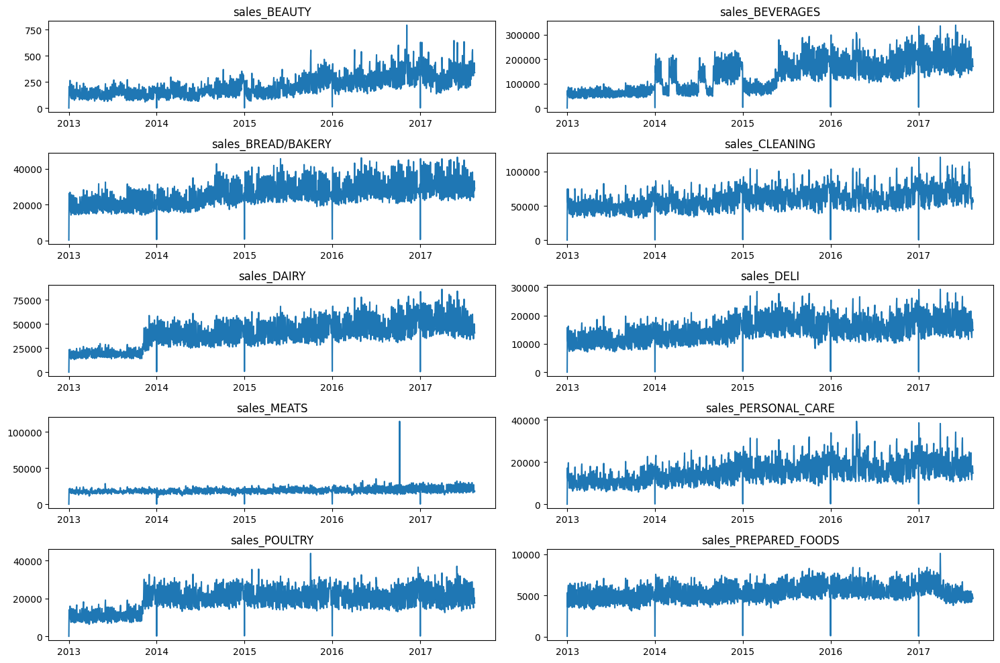

In [9]:
plt.figure(figsize=(15, 10))

cols = ['sales_BEAUTY', 'sales_BEVERAGES', 'sales_BREAD/BAKERY', 'sales_CLEANING', 'sales_DAIRY', 'sales_DELI', 'sales_MEATS', 'sales_PERSONAL_CARE', 'sales_POULTRY', 'sales_PREPARED_FOODS']

for i in range(0, 10):
    plt.subplot(5, 2, i + 1)
    plot_ts(pivot_df, cols[i])

plt.tight_layout()
plt.show()

In [10]:
data = pivot_df[cols]
data.insert(loc=0,
           column='date',
           value=pivot_df['date'])
train = data.loc[data['date'] < '2017-01-01']
valid = data.loc[(data['date'] >= '2017-01-01') & (data['date'] < '2017-04-01')]
train.head()

,date,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
0,2013-01-01,2.0,810.0,180.58900,186.0,143.0,71.09000,110.801000,25.0,42.637000,37.847000
1,2013-01-02,207.0,72092.0,26246.31900,74629.0,23381.0,15754.50000,20871.464028,17204.0,13975.884938,5338.111976
2,2013-01-03,125.0,52105.0,18456.48002,55893.0,18001.0,11172.45500,16597.398113,12568.0,10674.393983,3591.388005
3,2013-01-04,133.0,54167.0,16721.96901,52064.0,18148.0,10143.20900,21625.963055,11303.0,10772.515038,4472.965990
4,2013-01-05,191.0,77818.0,22367.76108,70128.0,23082.0,13734.94501,20879.091050,16819.0,13475.009055,5830.073020


In [11]:
dec25 = list()
for year in range(2013, 2017):
    dec25 += [{'date': pd.Timestamp(f'{year}-12-25'), 
               'sales_BEAUTY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_BEAUTY'].values[0],
               'sales_BEVERAGES': train.loc[(train['date'] == f'{year}-12-18'), 'sales_BEVERAGES'].values[0],
               'sales_BREAD/BAKERY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_BREAD/BAKERY'].values[0],
               'sales_CLEANING': train.loc[(train['date'] == f'{year}-12-18'), 'sales_CLEANING'].values[0],
               'sales_DAIRY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_DAIRY'].values[0],
               'sales_DELI': train.loc[(train['date'] == f'{year}-12-18'), 'sales_DELI'].values[0],
               'sales_MEATS': train.loc[(train['date'] == f'{year}-12-18'), 'sales_MEATS'].values[0],
               'sales_PERSONAL_CARE': train.loc[(train['date'] == f'{year}-12-18'), 'sales_PERSONAL_CARE'].values[0],
               'sales_POULTRY': train.loc[(train['date'] == f'{year}-12-18'), 'sales_POULTRY'].values[0],
               'sales_PREPARED_FOODS': train.loc[(train['date'] == f'{year}-12-18'), 'sales_PREPARED_FOODS'].values[0]
              }]
train = pd.concat([train, pd.DataFrame(dec25)], ignore_index=True).sort_values('date').reset_index()

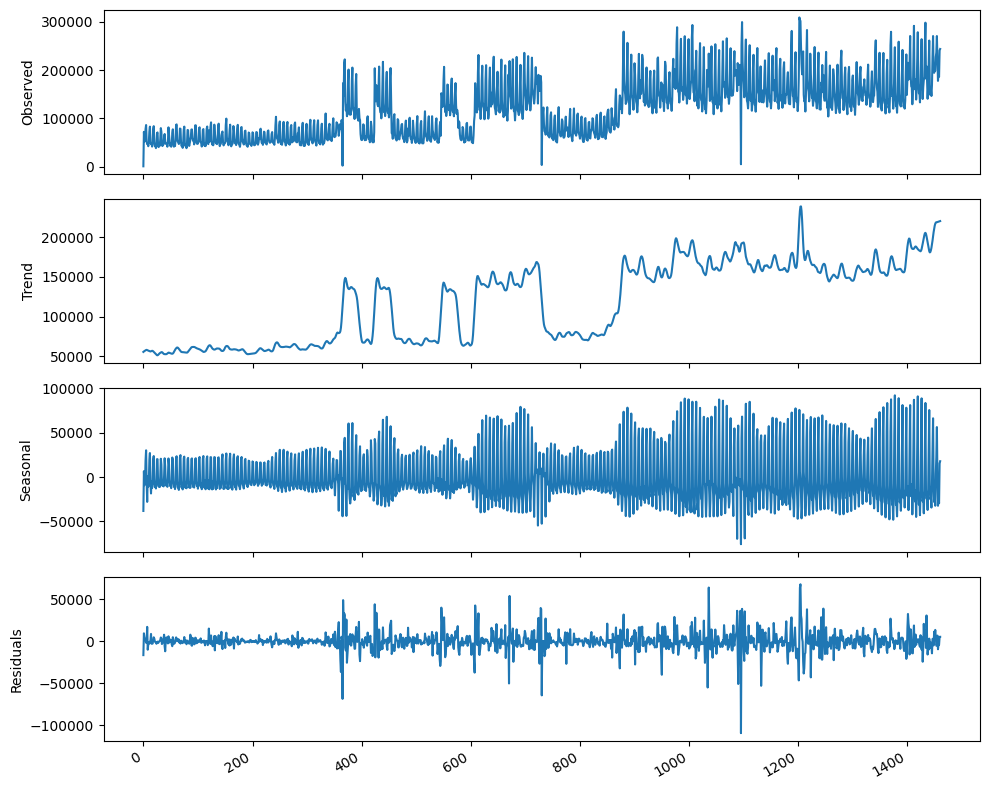

In [12]:
decomposition = STL(train['sales_BEVERAGES'], period=7).fit()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10,8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

fig.autofmt_xdate()
plt.tight_layout()

### Split & Scale Data

In [13]:
print(len(train))
print(len(valid))
print(len(train)*80/100)

1461
90
1168.8


In [14]:
train_df = train[:1168].drop(columns=['index', 'date'])
test_df = train[1168:].drop(columns=['index', 'date'])

In [15]:
#scaler
scaled_train = train_df.copy()
scalers={}

for i in train_df.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    s_s = scaler.fit_transform(scaled_train[i].values.reshape(-1,1))
    s_s = np.reshape(s_s,len(s_s))
    scalers['scaler_'+ i] = scaler
    scaled_train[i]=s_s
    
scaled_test = test_df.copy()
for i in test_df.columns:
    scaler = scalers['scaler_'+i]
    s_s = scaler.transform(scaled_test[i].values.reshape(-1,1))
    s_s=np.reshape(s_s,len(s_s))
    scalers['scaler_'+i] = scaler
    scaled_test[i]=s_s

## SARIMAX

In [ ]:
statistic = []
p_value = []
for i in range(10):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
sales_BEAUTY,-2.583382,0.09648
sales_BEVERAGES,-2.493775,0.11700
sales_BREAD/BAKERY,-1.472145,0.54724
sales_CLEANING,-3.481215,0.00848
sales_DAIRY,-1.384791,0.58955
sales_DELI,-1.951839,0.30808
sales_MEATS,-5.872383,0.00000
sales_PERSONAL_CARE,-2.753199,0.06528
sales_POULTRY,-1.926672,0.31962
sales_PREPARED_FOODS,-2.361816,0.15280


In [ ]:
diff_data = scaled_train.diff()
diff_data = diff_data.iloc[1:, :]

statistic = []
p_value = []
for i in range(10):
    ad_fuller_result = adfuller(diff_data[diff_data.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=diff_data.columns)
ADF_res

,Statistic,P-value
sales_BEAUTY,-10.078650,0.0
sales_BEVERAGES,-7.710860,0.0
sales_BREAD/BAKERY,-11.375610,0.0
sales_CLEANING,-10.872004,0.0
sales_DAIRY,-10.050339,0.0
sales_DELI,-11.673613,0.0
sales_MEATS,-11.559999,0.0
sales_PERSONAL_CARE,-11.759874,0.0
sales_POULTRY,-11.712611,0.0
sales_PREPARED_FOODS,-13.168108,0.0


### Find the optimize hyperparameters

In [ ]:
def optimize_SARIMAX(endog, exog, order_list, d, D, s):
    results = []
    for order in tqdm(order_list):
        try:
            model = SARIMAX(
                endog, exog, 
                order=(order[0], d, order[1]), 
                seasonal_order=(order[2], D, order[3], s), 
                simple_differencing=False
            ).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except:
            continue
    result_df = pd.DataFrame(results, columns=['(p,q,P,Q)', 'AIC'])
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    return result_df

In [ ]:
p = range(1, 4)
d = 1
q = range(1, 4)
P = range(1, 4)
D = 0
Q = range(1, 4)
s = 7
parameters = list(product(p, q, P, Q))

In [ ]:
def recursive_forecast(endog, exog, train_len, horizon, window, order, seasonal_order):
    pred_SARIMAX = []
    for i in range(train_len, train_len + horizon, window):
        try:
            model = SARIMAX(endog[:i], exog[:i], 
                            order=order, 
                            seasonal_order=seasonal_order, 
                            simple_differencing=False)
            res = model.fit(disp=False)
            predictions = res.get_prediction(exog=exog[i:i + window])
            oos_pred = predictions.predicted_mean.iloc[:window]
            pred_SARIMAX.extend(oos_pred)
        except:
            pred_SARIMAX.extend([np.nan] * window)
    return pred_SARIMAX[:horizon]

### Model training

In [ ]:
metrics = []
prediction_SARIMAX = []

# Loop through each variable as the target
for i, target_col in enumerate(scaled_train.columns):
    target = scaled_train[target_col]
    exog = scaled_train.drop(columns=[target_col])

    # Find best parameters for the SARIMAX model
    result_df = optimize_SARIMAX(target, exog, parameters, d, D, s)
    best_order = result_df.iloc[0]['(p,q,P,Q)']
    
    # Train SARIMAX with best parameters
    start = time.time()
    best_model = SARIMAX(target, exog, 
                         order=(best_order[0], d, best_order[1]), 
                         seasonal_order=(best_order[2], D, best_order[3], s), 
                         simple_differencing=False)
    best_model_fit = best_model.fit(disp=False)
    end = time.time()
    
    # Forecast on the test set
    target_test = scaled_test[target_col]
    exog_test = scaled_test.drop(columns=[target_col])
    train_len = len(target)
    horizon = len(target_test)
    window = 30
    
    pred_SARIMAX = recursive_forecast(target, exog, train_len, horizon, window, 
                                      (best_order[0], d, best_order[1]), 
                                      (best_order[2], D, best_order[3], s))
    
    # Compute performance metrics
    mse = mean_squared_error(target_test, pred_SARIMAX, squared=True)
    rmse = mean_squared_error(target_test, pred_SARIMAX, squared=False)
    mae = mean_absolute_error(target_test, pred_SARIMAX)
    r2 = r2_score(target_test, pred_SARIMAX)

    # Unscale predictions
    scaler = scalers[f'scaler_{target_col}']
    unscaled_SARIMAX = scaler.inverse_transform(
        np.array(pred_SARIMAX[:horizon]).reshape(-1, 1)
    )
    prediction_SARIMAX.append(unscaled_SARIMAX)
    
    # Unscaled target
    real_values = train.loc[1168:, target_col].values  # Adjust index as needed
    
    # Compute unscaled metrics
    unscale_mse = mean_squared_error(real_values, unscaled_SARIMAX)
    unscale_rmse = mean_squared_error(real_values, unscaled_SARIMAX, squared=False)
    unscale_mae = mean_absolute_error(real_values, unscaled_SARIMAX)
    
    
    # Store metrics
    metrics.append({
        'Variable': target_col,
        'Best Order': best_order,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'Unscale MSE': unscale_mse,
        'Unscale RMSE': unscale_rmse,
        'Unscale MAE': unscale_mae,
        'R2': r2,
        'Time': end-start
    })

In [ ]:
metrics_df = pd.DataFrame(metrics)
print(metrics_df)

               Variable    Best Order       MSE      RMSE       MAE  \
0          sales_BEAUTY  [3, 1, 1, 1]  0.460567  0.678651  0.560684   
1       sales_BEVERAGES  [1, 2, 1, 1]  0.684454  0.827317  0.760577   
2    sales_BREAD/BAKERY  [2, 2, 3, 3]  0.310524  0.557247  0.472723   
3        sales_CLEANING  [1, 1, 3, 3]  0.243478  0.493435  0.384280   
4           sales_DAIRY  [1, 2, 3, 3]  0.902522  0.950012  0.877659   
5            sales_DELI  [3, 2, 2, 3]  0.293414  0.541677  0.443357   
6           sales_MEATS  [1, 1, 2, 3]  0.356420  0.597009  0.340810   
7   sales_PERSONAL_CARE  [1, 2, 2, 3]  0.292742  0.541056  0.428270   
8         sales_POULTRY  [2, 1, 2, 3]  0.293861  0.542090  0.480307   
9  sales_PREPARED_FOODS  [1, 2, 2, 2]  0.239395  0.489280  0.387636   

    Unscale MSE   Unscale RMSE    Unscale MAE        R2       Time  
0  3.495713e+04     186.968269     154.468358 -2.631418  32.201599  
1  1.523302e+10  123422.101848  113465.493578 -6.591169  31.055792  
2  1.601222

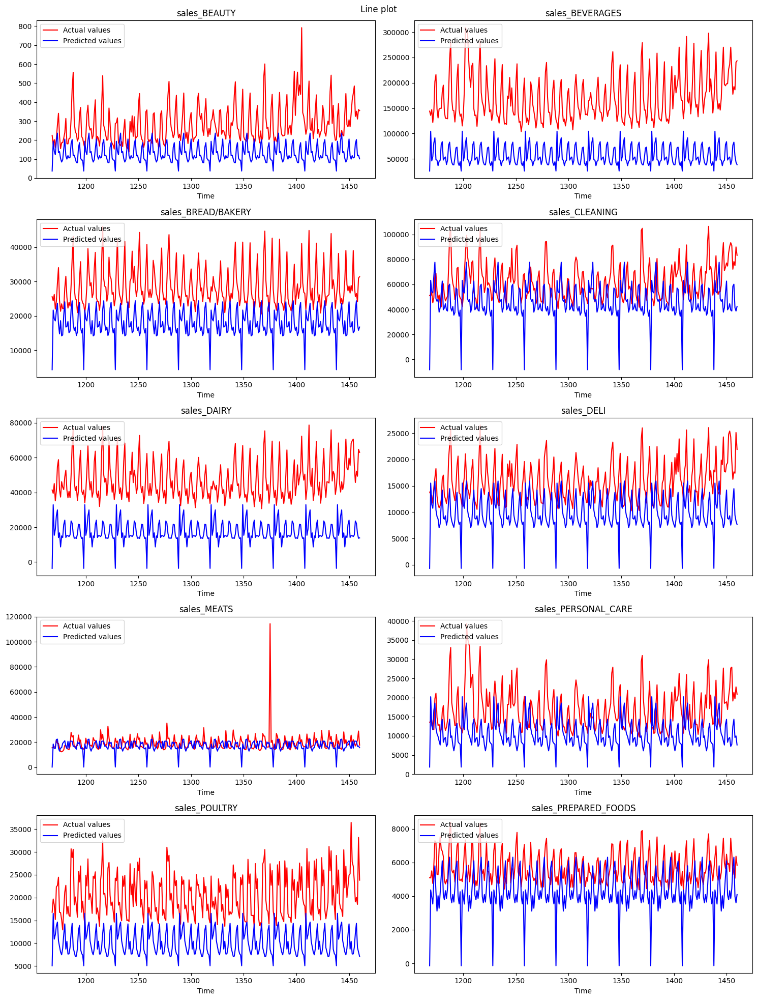

In [ ]:
plt.figure(figsize=(15, 20))
prediction_SARIMAX = np.array(prediction_SARIMAX)
for i in range(10):
    plt.subplot(5, 2, i + 1)  
    plt.plot(test_df.index, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(test_df.index, prediction_SARIMAX[i], 'b-', label='Predicted values')
    plt.xlabel('Time')
    plt.title(f'{test_df.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Line plot')
plt.tight_layout()
plt.show()

## Gaussian Process

In [41]:
train_Gaussian = diff_data
test_Gaussian = scaled_test

In [42]:
X_train = train_Gaussian.index.values.reshape(-1, 1)
y_train = train_Gaussian.values

X_test = test_Gaussian.index.values.reshape(-1, 1)
y_test = test_Gaussian.values

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1167, 1) (1167, 10) (293, 1) (293, 10)


### Define model

In [43]:
from sklearn.gaussian_process.kernels import RationalQuadratic, ExpSineSquared, WhiteKernel, RBF

kernel = (7.07**2 * RBF(length_scale=7) + 
          1.41**2 * RBF(length_scale=14) * ExpSineSquared(length_scale=1, periodicity=7) + 
          0.707**2 * RationalQuadratic(alpha=1, length_scale=1))

In [44]:
start = time.time()
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
gp.fit(X_train, y_train)
end = time.time()

In [45]:
gp

GaussianProcessRegressor(kernel=7.07**2 * RBF(length_scale=7) + 1.41**2 * RBF(length_scale=14) * ExpSineSquared(length_scale=1, periodicity=7) + 0.707**2 * RationalQuadratic(alpha=1, length_scale=1),
                         n_restarts_optimizer=10)

In [46]:
print(gp.score(X_train, y_train))
print(end-start)

1.0
641.8345673084259


In [47]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(train_df.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [48]:
y_pred, sigma = gp.predict(X_test, return_std=True)
last_value = scaled_train.iloc[-1, :].values
y_pred = y_pred.cumsum(axis=0) + last_value

In [49]:
y_pred_unscale = unscale(y_pred)
sigma_unscale = unscale(sigma)

In [50]:
pred_scaled_Gau = pd.DataFrame(data=y_pred, columns=train.drop(columns=['index', 'date']).columns)
pred_scaled_Gau.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
0,-0.335379,0.018845,0.159537,-0.048846,0.287403,-0.101450,0.116922,-0.221094,-0.230398,0.171345
1,-0.348898,-0.063469,0.077024,-0.102503,0.198378,-0.168820,0.077283,-0.277201,-0.258428,0.131294
2,-0.394010,-0.060022,0.100470,-0.113719,0.276557,-0.219682,0.066817,-0.311056,-0.249342,0.204293
3,-0.465164,-0.188440,-0.041892,-0.259074,0.065609,-0.281017,0.124750,-0.441425,-0.349126,0.083793
4,-0.445748,-0.098204,0.018736,-0.203215,0.164923,-0.140498,0.571764,-0.419627,0.020628,0.226815


In [51]:
pred_Gau = pd.DataFrame(y_pred_unscale, columns=train.drop(columns=['index', 'date']).columns)
pred_Gau.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
0,185.103143,152804.801503,26511.307764,49685.978048,44061.465941,12809.029205,15940.730906,13195.516270,16855.291575,4861.696734
1,181.378706,140525.015259,24637.606362,46893.552207,41024.460748,11853.995010,15378.927756,12246.806575,16242.946164,4696.696393
2,168.950214,141039.219964,25170.025349,46309.817614,43691.481736,11132.970032,15230.602426,11674.357061,16441.442917,4997.431159
3,149.347346,121881.338050,21937.278379,38745.287505,36495.180501,10263.468286,16051.672155,9469.948430,14261.571932,4501.008287
4,154.696478,135343.094172,23314.019826,41652.301851,39883.168249,12255.486905,22387.109893,9838.529113,22339.176777,5090.212301


### Model Evaluation
#### Scaled data


In [52]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_scaled_Gau)}')

MSE for sales_BEAUTY: 0.12183897325273615
MSE for sales_BEVERAGES: 0.033598570423145194
MSE for sales_BREAD/BAKERY: 0.0159183799135521
MSE for sales_CLEANING: 0.1456124666854924
MSE for sales_DAIRY: 0.031493071469885475
MSE for sales_DELI: 0.11554992222925069
MSE for sales_MEATS: 0.17133003970701308
MSE for sales_PERSONAL_CARE: 0.14292872915391286
MSE for sales_POULTRY: 0.045324177540703205
MSE for sales_PREPARED_FOODS: 0.01868381466213084
MSE total: 0.08422781450378221


In [53]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_scaled_Gau, squared=False)}')

RMSE for sales_BEAUTY: 0.3490543987013144
RMSE for sales_BEVERAGES: 0.18329912826619005
RMSE for sales_BREAD/BAKERY: 0.12616806217720908
RMSE for sales_CLEANING: 0.38159201601382126
RMSE for sales_DAIRY: 0.17746287349720638
RMSE for sales_DELI: 0.33992634824216067
RMSE for sales_MEATS: 0.4139203301445981
RMSE for sales_PERSONAL_CARE: 0.37805916091785535
RMSE for sales_POULTRY: 0.21289475695916799
RMSE for sales_PREPARED_FOODS: 0.13668875104459344
RMSE total: 0.26990658259641165


In [54]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_scaled_Gau)}')

MAE for sales_BEAUTY: 0.26385247238946186
MAE for sales_BEVERAGES: 0.1274171545734781
MAE for sales_BREAD/BAKERY: 0.0987393627408089
MAE for sales_CLEANING: 0.3163370681505436
MAE for sales_DAIRY: 0.14451770348861662
MAE for sales_DELI: 0.2808701656979505
MAE for sales_MEATS: 0.15528541097761497
MAE for sales_PERSONAL_CARE: 0.2862574289193635
MAE for sales_POULTRY: 0.16691686192366084
MAE for sales_PREPARED_FOODS: 0.10033860894594261
MAE total: 0.1940532237807442


In [55]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'R2 total: {r2_score(scaled_test, pred_scaled_Gau)}')

R2 for sales_BEAUTY: 0.03933965406658246
R2 for sales_BEVERAGES: 0.6273637105102278
R2 for sales_BREAD/BAKERY: 0.7352452896992925
R2 for sales_CLEANING: -0.9143933421592896
R2 for sales_DAIRY: 0.6710115693107903
R2 for sales_DELI: -0.6962201585477059
R2 for sales_MEATS: 0.2853394269021263
R2 for sales_PERSONAL_CARE: -0.33347632133536087
R2 for sales_POULTRY: 0.056741451597658865
R2 for sales_PREPARED_FOODS: 0.6000295528641713
R2 total: 0.10709808329084917


#### Unscaled data


In [56]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, pred_Gau)}')

MSE for sales_BEAUTY: 9247.608529625986
MSE for sales_BEVERAGES: 747760263.930158
MSE for sales_BREAD/BAKERY: 8208341.064184871
MSE for sales_CLEANING: 394372402.03244495
MSE for sales_DAIRY: 36650534.19317899
MSE for sales_DELI: 23221162.656705692
MSE for sales_MEATS: 34414817.99988568
MSE for sales_PERSONAL_CARE: 40865364.830284745
MSE for sales_POULTRY: 21630675.19147528
MSE for sales_PREPARED_FOODS: 317098.6656711282
MSE total: 130744990.81725188


In [57]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, pred_Gau)}')

MAE for sales_BEAUTY: 72.69135614329674
MAE for sales_BEVERAGES: 19008.537079312468
MAE for sales_BREAD/BAKERY: 2242.170240089
MAE for sales_CLEANING: 16462.813700690585
MAE for sales_DAIRY: 4930.076936810667
MAE for sales_DELI: 3981.6470710408403
MAE for sales_MEATS: 2200.8307055296373
MAE for sales_PERSONAL_CARE: 4840.326865597518
MAE for sales_POULTRY: 3646.4501705418847
MAE for sales_PREPARED_FOODS: 413.36386365024
MAE total: 5779.890798940614


In [58]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, pred_Gau, squared=False)}')

RMSE for sales_BEAUTY: 96.16448684221211
RMSE for sales_BEVERAGES: 27345.20550169916
RMSE for sales_BREAD/BAKERY: 2865.0202554580433
RMSE for sales_CLEANING: 19858.811697391284
RMSE for sales_DAIRY: 6053.968466483699
RMSE for sales_DELI: 4818.834159493943
RMSE for sales_MEATS: 5866.414407445632
RMSE for sales_PERSONAL_CARE: 6392.602351960018
RMSE for sales_POULTRY: 4650.878969772841
RMSE for sales_PREPARED_FOODS: 563.1151442388388
RMSE total: 7851.101544078566


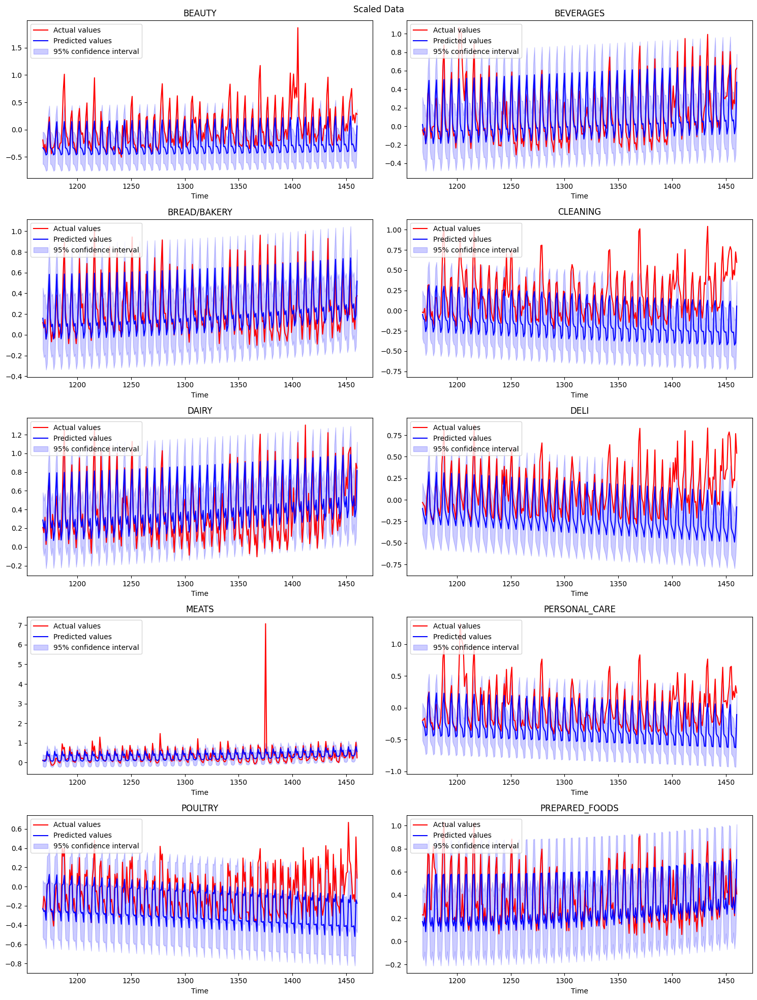

In [59]:
plt.figure(figsize=(15, 20))
for i in range(10):
    plt.subplot(5, 2, i + 1)  
    plt.plot(X_test, y_test[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, y_pred[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), y_pred[:, i] - 1.96 * sigma[:, i], y_pred[:, i] + 1.96 * sigma[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{train_Gaussian.columns[i][6:]}')
    plt.legend(loc='upper left')

plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

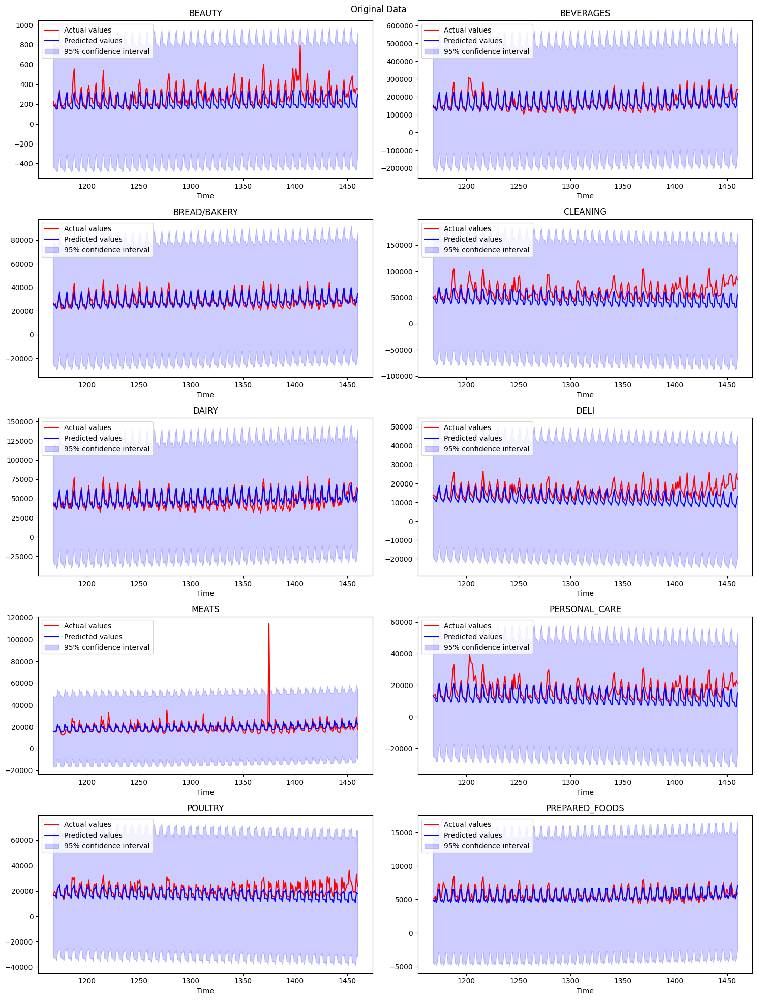

In [60]:
plt.figure(figsize=(15, 20))
for i in range(10):
    plt.subplot(5, 2, i + 1)  
    plt.plot(X_test, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, pred_Gau.iloc[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), pred_Gau.iloc[:, i] - 1.96 * sigma_unscale[:, i], pred_Gau.iloc[:, i] + 1.96 * sigma_unscale[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{train_Gaussian.columns[i][6:]}')
    plt.legend(loc='upper left')

plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## VAR
### Find the optimize hyperparameters

In [61]:
def optimize_VAR(endog: Union[pd.Series, list]) -> pd.DataFrame:
    results = [[2, -27523.789886475883], [3, -28410.49603359954], [4, -29469.19410944266], [5, -30505.789261394668], [6, -31520.52696346849], [7, -31852.696873037465], [8, -31866.17126418741], [9, -31865.88461944672], [10, -31873.78986210983], [11, 805138.0060924445], [12, -31882.34893795087], [13, -31978.215369387115], [14, -31997.592176438186], [15, -31914.78981692301]]
    for i in tqdm_notebook(range(1, 2)):
        try:
            model = VARMAX(endog, order=(i, 0)).fit(dips=False)
        except:
            continue
            
        aic = model.aic
        results.append([i, aic])
        print(results)
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['p', 'AIC']
    
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [62]:
#result_df = optimize_VAR(scaled_train)
#result_df

In [63]:
result_df = optimize_VAR(diff_data)
result_df

  0%|          | 0/1 [00:00<?, ?it/s]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          165     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10707D+01    |proj g|=  8.30311D-01


 This problem is unconstrained.



At iterate    5    f= -1.10746D+01    |proj g|=  2.46821D-01

At iterate   10    f= -1.10748D+01    |proj g|=  1.30332D-01

At iterate   15    f= -1.10750D+01    |proj g|=  5.80724D-02

At iterate   20    f= -1.10751D+01    |proj g|=  1.03482D-01

At iterate   25    f= -1.10754D+01    |proj g|=  1.48446D-01

At iterate   30    f= -1.10757D+01    |proj g|=  4.95940D-02

At iterate   35    f= -1.10759D+01    |proj g|=  4.97462D-02

At iterate   40    f= -1.10760D+01    |proj g|=  1.51232D-02

At iterate   45    f= -1.10760D+01    |proj g|=  1.89748D-02

At iterate   50    f= -1.10761D+01    |proj g|=  1.73134D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

,p,AIC
0,14,-31997.592176
1,13,-31978.215369
2,15,-31914.789817
3,12,-31882.348938
4,10,-31873.789862
5,8,-31866.171264
6,9,-31865.884619
7,7,-31852.696873
8,6,-31520.526963
9,5,-30505.789261


### Performing tests

In [64]:
def granger_causality_matrix(data, max_lag):
    variables = data.columns
    df = pd.DataFrame(index=variables, columns=variables)
    for var1 in variables:
        for var2 in variables:
            test_result = grangercausalitytests(data[[var1, var2]], max_lag, verbose=False)
            p_values = [round(test[0]['ssr_ftest'][1], 4) for test in test_result.values()]
            min_p_value = np.min(p_values)
            df.loc[var1, var2] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [65]:
result = granger_causality_matrix(diff_data, 14)
result

,sales_BEAUTY_x,sales_BEVERAGES_x,sales_BREAD/BAKERY_x,sales_CLEANING_x,sales_DAIRY_x,sales_DELI_x,sales_MEATS_x,sales_PERSONAL_CARE_x,sales_POULTRY_x,sales_PREPARED_FOODS_x
sales_BEAUTY_y,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_BEVERAGES_y,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_BREAD/BAKERY_y,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_CLEANING_y,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
sales_DAIRY_y,0.0,0.0001,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
sales_DELI_y,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
sales_MEATS_y,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
sales_PERSONAL_CARE_y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
sales_POULTRY_y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
sales_PREPARED_FOODS_y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


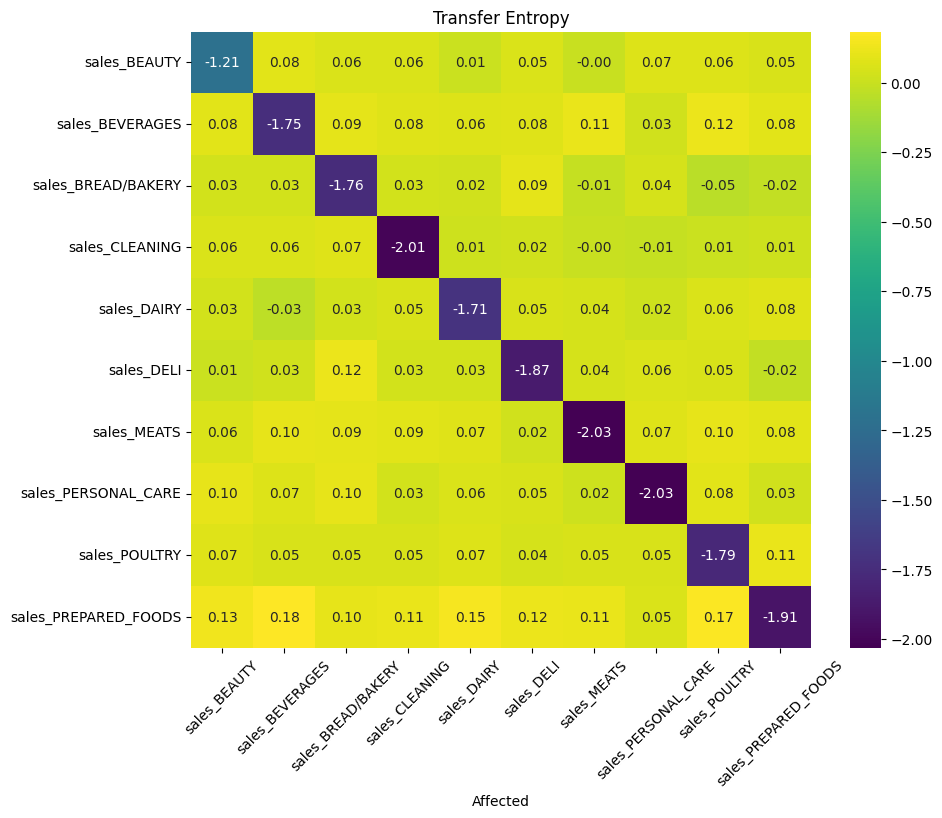

In [66]:
transfer_entropy_matrix = np.zeros((10, 10))

for i in range(10):
    for j in range(10):
        transfer = transent(scaled_train.iloc[:, i], scaled_train.iloc[:, j], lag=14)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{scaled_train.columns[i]}' for i in range(10)], 
                                   index=[f'{scaled_train.columns[j]}' for j in range(10)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

### Model training

In [67]:
start = time.time()
best_model = VARMAX(diff_data, order=(14,0))
best_model_fit = best_model.fit(disp=False)
end = time.time()
print(best_model_fit.summary())

                                                                                                              Statespace Model Results                                                                                                             
Dep. Variable:     ['sales_BEAUTY', 'sales_BEVERAGES', 'sales_BREAD/BAKERY', 'sales_CLEANING', 'sales_DAIRY', 'sales_DELI', 'sales_MEATS', 'sales_PERSONAL_CARE', 'sales_POULTRY', 'sales_PREPARED_FOODS']   No. Observations:                 1167
Model:                                                                                                                                                                                             VAR(14)   Log Likelihood               17463.796
                                                                                                                                                                                               + intercept   AIC                         -31997.592
Date:                   

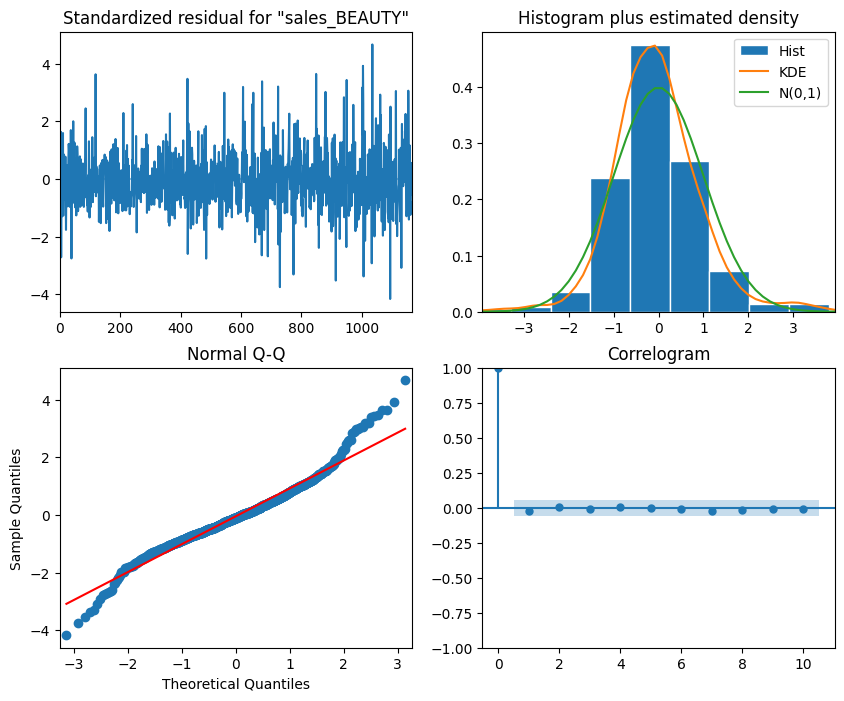

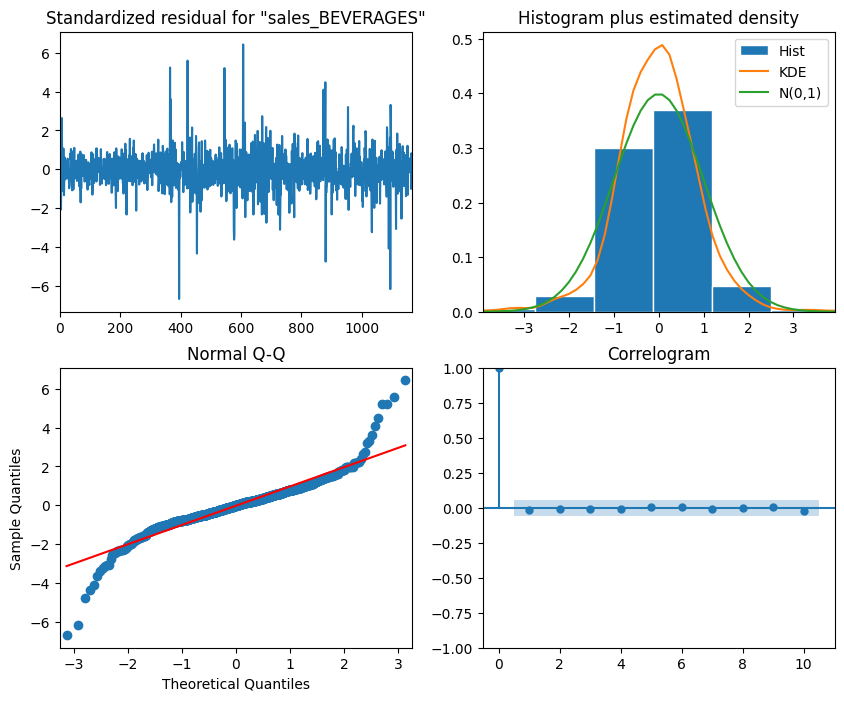

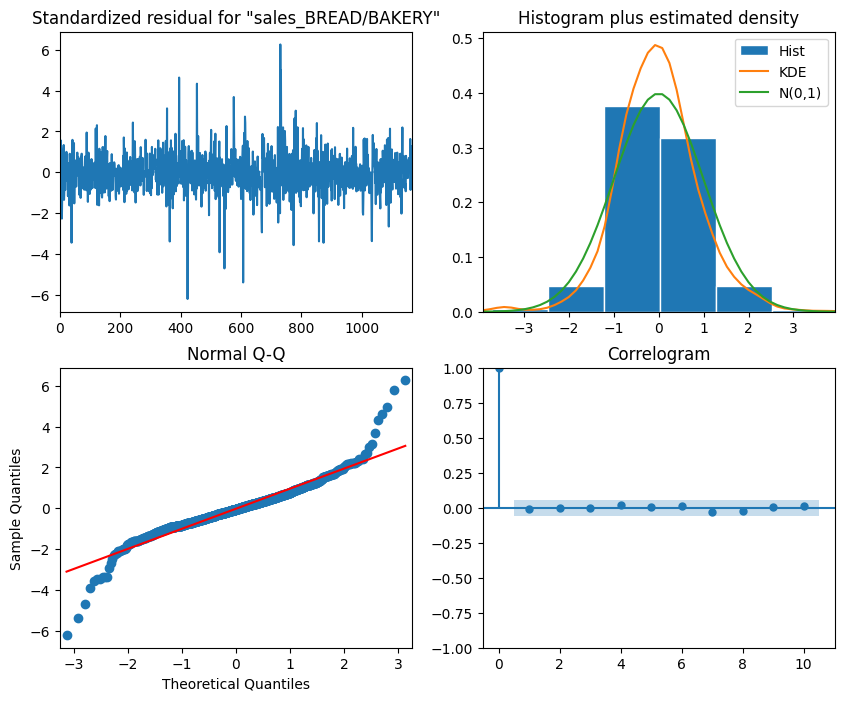

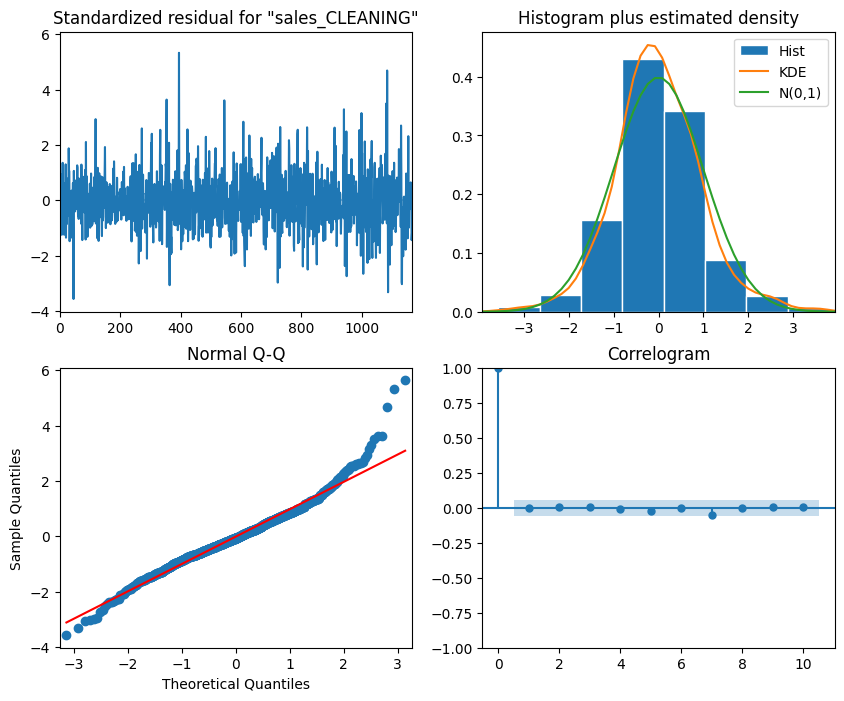

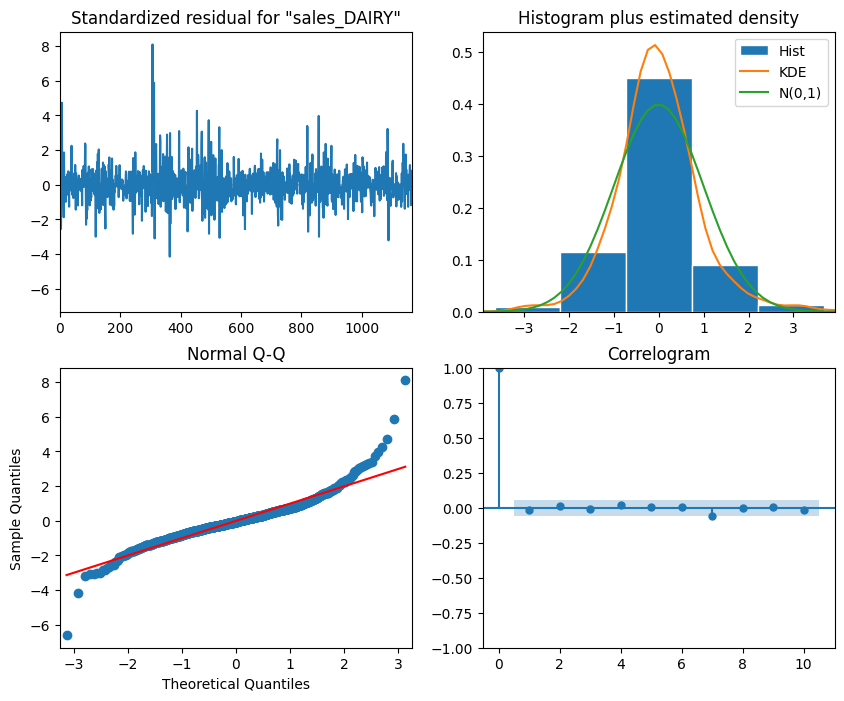

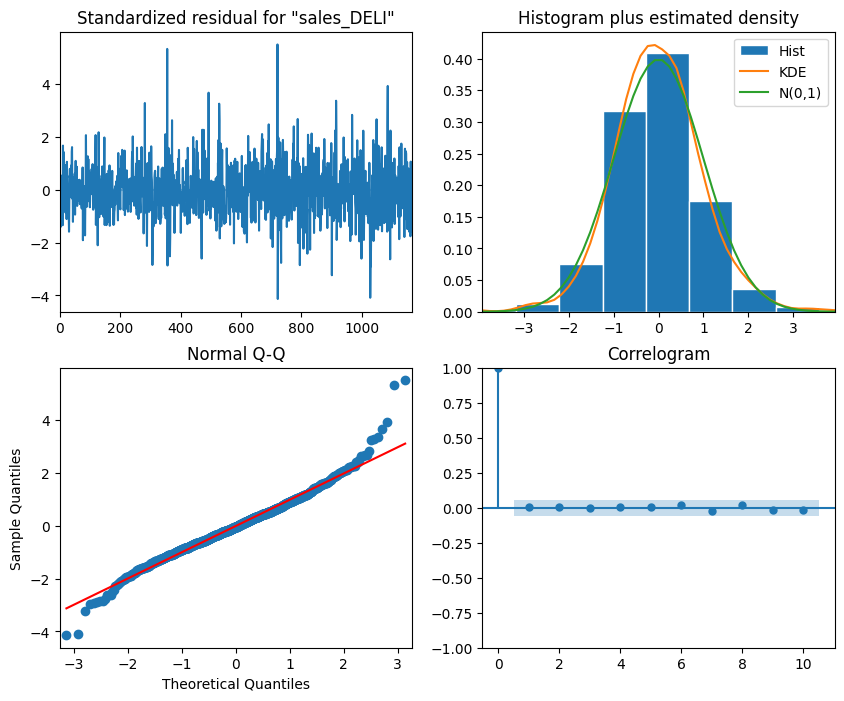

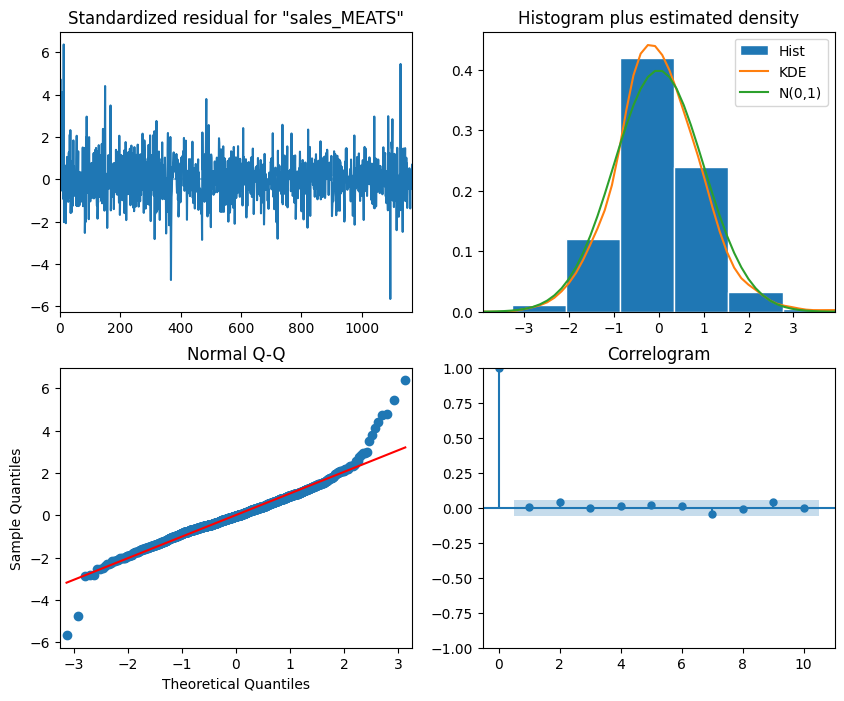

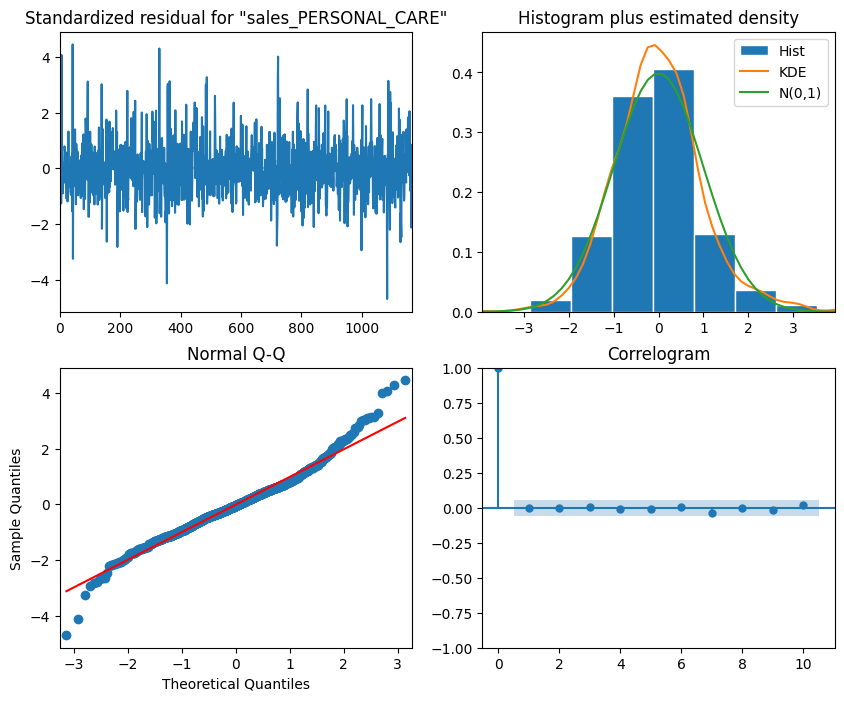

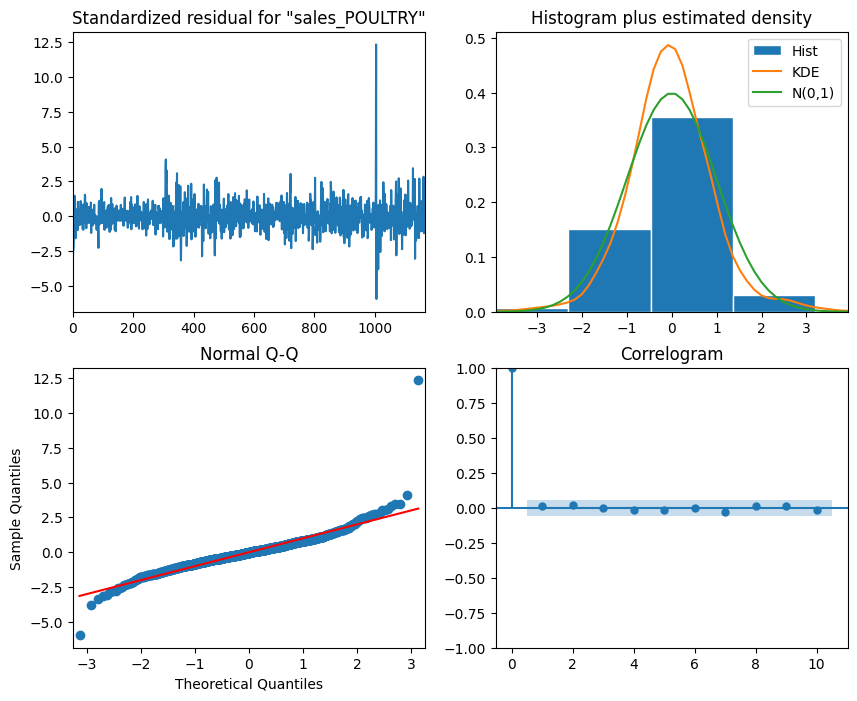

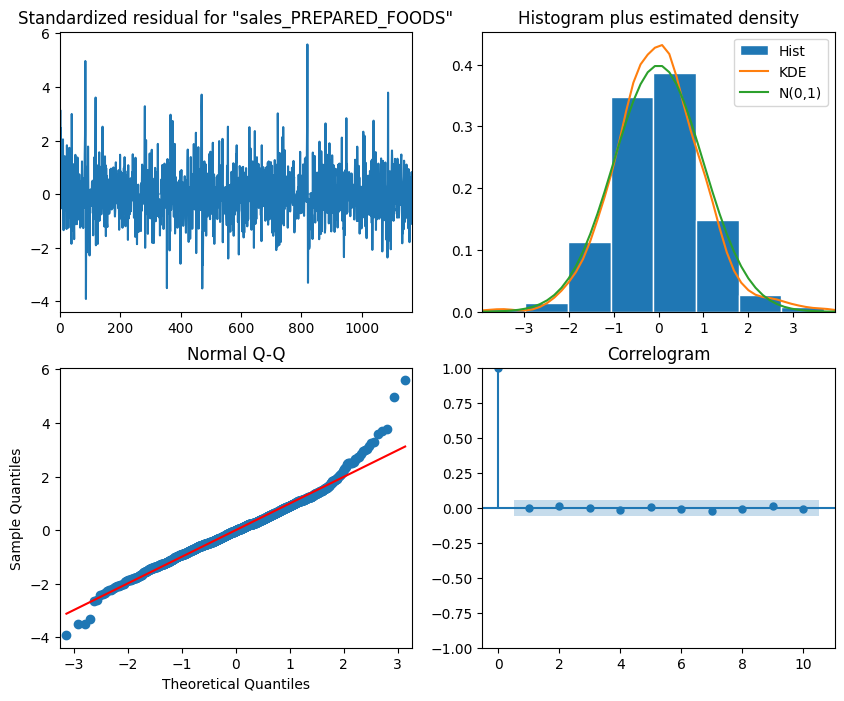

In [68]:
for i in range(10):
    best_model_fit.plot_diagnostics(figsize=(10, 8), variable=i)

plt.show()

In [69]:
print(end-start)

4443.132448673248


In [70]:
TRAIN_LEN = len(scaled_train)
HORIZON = len(scaled_test)
WINDOW = HORIZON

In [71]:
def rolling_forecast(df: pd.DataFrame, train_len: int, horizon: int, window: int) -> pd.DataFrame:
    
    total_len = train_len + horizon
    end_idx = train_len
    
    predictions_dict = {col: [] for col in df.columns}

    for i in range(train_len, total_len, window):
        #model = VARMAX(df[:i], order=(14,0))
        #res = model.fit(disp=False)
        predictions = best_model_fit.get_prediction(0, i + window - 1)

        for col in df.columns:
            oos_pred = predictions.predicted_mean.iloc[-window:][col]
            predictions_dict[col].extend(oos_pred)

    predictions_df = pd.DataFrame(predictions_dict)
    return predictions_df


In [72]:
pred_VAR = rolling_forecast(diff_data, TRAIN_LEN, HORIZON, WINDOW)
pred_VAR.index = pd.RangeIndex(1168,1168 + len(pred_VAR))

In [73]:
last_values = scaled_train.iloc[-1, :]
pred_VAR = pred_VAR.cumsum() + last_values

In [74]:
pred_VAR.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
1168,0.141176,0.431511,0.479837,0.309135,0.723420,0.278873,0.375532,0.231018,0.167992,0.568879
1169,0.176422,0.487639,0.573199,0.381415,0.862148,0.287935,0.390569,0.282605,0.174294,0.687331
1170,0.151810,0.343163,0.432955,0.261140,0.649776,0.241571,0.536132,0.199933,0.103991,0.514194
1171,0.108322,0.419487,0.471181,0.299886,0.752056,0.373351,0.964874,0.171825,0.498029,0.640436
1172,0.583100,0.894637,0.813857,0.743923,1.220814,0.651570,0.709281,0.687111,0.531507,1.025499


### Model Evaluation
#### Scaled data


In [75]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_VAR.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_VAR)}')

MSE for sales_BEAUTY: 0.29549862294815293
MSE for sales_BEVERAGES: 0.5718722640605813
MSE for sales_BREAD/BAKERY: 0.3752080617435723
MSE for sales_CLEANING: 0.2734389566763421
MSE for sales_DAIRY: 0.7146094370287676
MSE for sales_DELI: 0.3110390981061703
MSE for sales_MEATS: 0.38129147605847413
MSE for sales_PERSONAL_CARE: 0.42159878947427837
MSE for sales_POULTRY: 0.3433167873671143
MSE for sales_PREPARED_FOODS: 0.34125037509845474
MSE total: 0.4029123868561908


In [76]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_VAR.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_VAR, squared=False)}')

RMSE for sales_BEAUTY: 0.5435978503895623
RMSE for sales_BEVERAGES: 0.7562223641632012
RMSE for sales_BREAD/BAKERY: 0.6125422938406558
RMSE for sales_CLEANING: 0.5229139094309331
RMSE for sales_DAIRY: 0.8453457499915449
RMSE for sales_DELI: 0.5577087932838878
RMSE for sales_MEATS: 0.6174880371784333
RMSE for sales_PERSONAL_CARE: 0.6493063910622461
RMSE for sales_POULTRY: 0.5859324085311498
RMSE for sales_PREPARED_FOODS: 0.5841663933319468
RMSE total: 0.6275224191203562


In [77]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_VAR.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_VAR)}')

MAE for sales_BEAUTY: 0.49189920417299726
MAE for sales_BEVERAGES: 0.7038299248753255
MAE for sales_BREAD/BAKERY: 0.5631970443035721
MAE for sales_CLEANING: 0.46523162404608315
MAE for sales_DAIRY: 0.7830196335763033
MAE for sales_DELI: 0.5141427659812888
MAE for sales_MEATS: 0.46672626870023626
MAE for sales_PERSONAL_CARE: 0.586757051156542
MAE for sales_POULTRY: 0.5473076948116057
MAE for sales_PREPARED_FOODS: 0.5341870719291646
MAE total: 0.565629828355312


In [78]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(scaled_test.iloc[:, i], pred_VAR.iloc[:, i])}')
    
print(f'R2 total: {r2_score(scaled_test, pred_VAR)}')

R2 for sales_BEAUTY: -1.3299097305701078
R2 for sales_BEVERAGES: -5.342542431354486
R2 for sales_BREAD/BAKERY: -5.240465564264997
R2 for sales_CLEANING: -2.59495124328064
R2 for sales_DAIRY: -6.465078071810211
R2 for sales_DELI: -3.5659121021080837
R2 for sales_MEATS: -0.5904623921366501
R2 for sales_PERSONAL_CARE: -2.9333729908296133
R2 for sales_POULTRY: -6.144895110412965
R2 for sales_PREPARED_FOODS: -6.305256853678931
R2 total: -4.0512846490446695


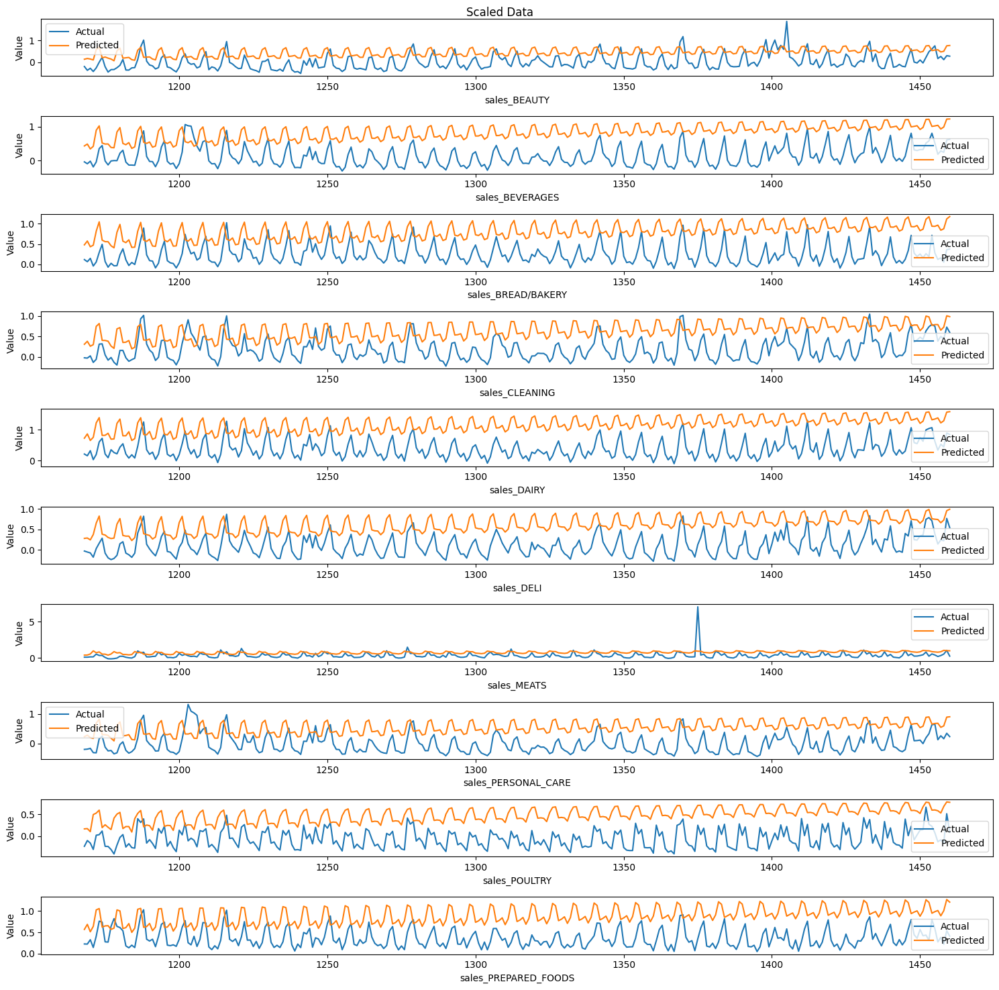

In [79]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(scaled_test.iloc[:, i], label='Actual')
    plt.plot(pred_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data


In [80]:
def inverse(dataset):
    temp = dataset.copy()
    for index, i in enumerate(scaled_test.columns):
        scaler = scalers['scaler_' + i]
        temp.iloc[:, index] = scaler.inverse_transform(np.reshape(dataset.iloc[:, index], (-1, 1))).flatten()
    return temp

In [81]:
inverse_VAR = inverse(pred_VAR)
inverse_VAR.head()

,sales_BEAUTY,sales_BEVERAGES,sales_BREAD/BAKERY,sales_CLEANING,sales_DAIRY,sales_DELI,sales_MEATS,sales_PERSONAL_CARE,sales_POULTRY,sales_PREPARED_FOODS
1168,316.394041,214367.868194,33784.674628,68315.985411,58935.741666,18200.531818,19605.950177,20840.286610,25558.482997,6499.411808
1169,326.104376,222741.247449,35904.751002,72077.620238,63668.312955,18328.996507,19819.073313,21712.564603,25696.154490,6987.398389
1170,319.323562,201187.686506,32720.084361,65818.227085,56423.447584,17671.744055,21882.105171,20314.672860,24160.319250,6274.128417
1171,307.342673,212574.010741,33588.117344,67834.666961,59912.627749,19539.866162,27958.584739,19839.396278,32768.438620,6794.202814
1172,438.144017,283458.521815,41369.598444,90943.265106,75903.840100,23483.928973,24336.121200,28552.357230,33499.784950,8380.544455


In [82]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], inverse_VAR.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, inverse_VAR)}')

MSE for sales_BEAUTY: 22428.419356420545
MSE for sales_BEVERAGES: 12727427081.650436
MSE for sales_BREAD/BAKERY: 193476707.90297955
MSE for sales_CLEANING: 740573802.5619109
MSE for sales_DAIRY: 831637448.6253461
MSE for sales_DELI: 62507090.87790321
MSE for sales_MEATS: 76589468.93317634
MSE for sales_PERSONAL_CARE: 120541114.76300871
MSE for sales_POULTRY: 163845751.16999722
MSE for sales_PREPARED_FOODS: 5791645.901027736
MSE total: 1492241254.0805142


In [83]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], inverse_VAR.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, inverse_VAR)}')

MAE for sales_BEAUTY: 135.51823074966075
MAE for sales_BEVERAGES: 104999.81159763811
MAE for sales_BREAD/BAKERY: 12789.060178141572
MAE for sales_CLEANING: 24211.584178606252
MAE for sales_DAIRY: 26711.931779822015
MAE for sales_DELI: 7288.545699324068
MAE for sales_MEATS: 6614.822968661423
MAE for sales_PERSONAL_CARE: 9921.474978005966
MAE for sales_POULTRY: 11956.432765896408
MAE for sales_PREPARED_FOODS: 2200.684604702975
MAE total: 20682.986698154848


In [84]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], inverse_VAR.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, inverse_VAR, squared=False)}')

RMSE for sales_BEAUTY: 149.76120778232442
RMSE for sales_BEVERAGES: 112815.89906414093
RMSE for sales_BREAD/BAKERY: 13909.59050090906
RMSE for sales_CLEANING: 27213.48567460462
RMSE for sales_DAIRY: 28838.124915211567
RMSE for sales_DELI: 7906.142604197271
RMSE for sales_MEATS: 8751.540946209207
RMSE for sales_PERSONAL_CARE: 10979.12176647152
RMSE for sales_POULTRY: 12800.22465310657
RMSE for sales_PREPARED_FOODS: 2406.583865363461
RMSE total: 22577.047519799653


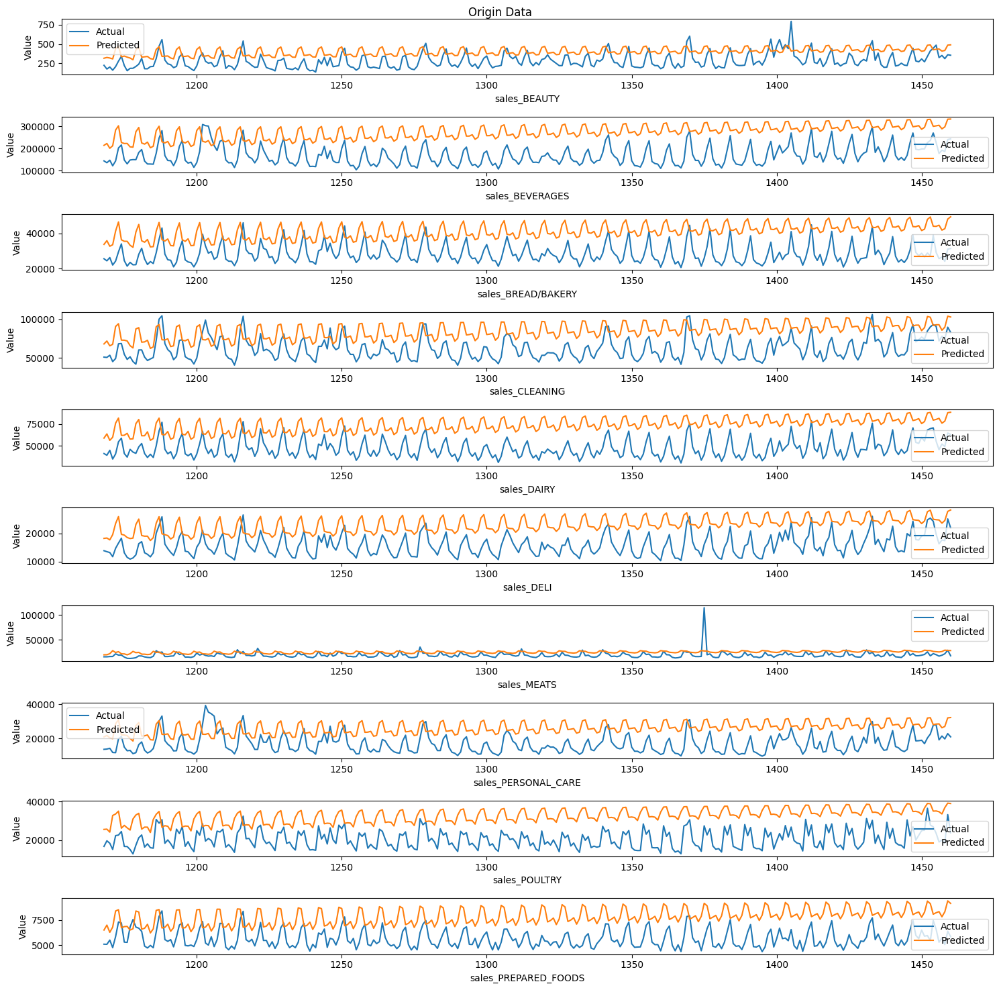

In [85]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(test_df.iloc[:, i], label='Actual')
    plt.plot(inverse_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()

plt.suptitle('Origin Data')
plt.tight_layout()
plt.show()

# CNN
### Split data

In [ ]:
def to_sequences_multivariate(dataset, p):
    x = []
    y = []
    for i in range(p, len(dataset)):
        x.append(dataset.iloc[i - p:i, 0:dataset.shape[1]])
        y.append(dataset.iloc[i:i + 1, 0:dataset.shape[1]])
    x = np.array(x)
    y = np.array(y)
    return x,y.reshape(y.shape[0], y.shape[2])

In [ ]:
def difference(dataset, order=1):
    return dataset.diff(periods=order).dropna()

VAR_train_diff = difference(scaled_train, order=1)
VAR_test_diff = difference(scaled_test, order=1)

In [ ]:
p = 14

trainX, trainY = to_sequences_multivariate(VAR_train_diff, p)
testX, testY = to_sequences_multivariate(VAR_test_diff, p)


### Find optimal parameters

In [ ]:
def build_cnn_model(filters, kernel_size, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer') # (batch_size, n_past, n_features)
        
        # Reshape input to (samples, n_past, n_features, 1) to work with Conv2D
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
        
        # Lớp 1: Conv2D với kernel_size (7, n_features) và padding='same'
        conv1 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(kernel_size, n_features),  # Kích thước kernel (7, n_features)
            activation='relu',
            padding='same', 
            name='conv1_layer')(x) # (batch_size, n_past, n_features, filters)
        
        # Batch Normalization sau lớp Conv1
        conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
        
        # MaxPooling sau lớp Conv1 với pool_size (2, 2)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)
        
        # Lớp 2: Conv2D với kernel_size (3, 3) và padding='same'
        conv2 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(3, 3),  # Kích thước kernel (3, 3)
            activation='relu',
            padding='same', 
            name='conv2_layer')(pool1)
        
        # Batch Normalization sau lớp Conv2
        conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
        
        # MaxPooling sau lớp Conv2 với pool_size (2, 2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)
        
        # Flatten để đưa đầu ra vào lớp Dense
        flatten = layers.Flatten(name='flatten')(pool2)
        
        # Output layer: dự đoán cho mỗi đặc trưng (n_features)
        outputs = layers.Dense(n_features, name='output')(flatten)
        
        # Tạo và biên dịch mô hình
        model_CNN = tf.keras.models.Model(inputs, outputs)
        model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_CNN

In [ ]:
print('Starting find optimal parameters for CNN model')

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_cnn_model(params['filters'], params['kernel_size'], p, 10)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0,
        validation_split=0.2
    )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_CNN = results[0]

Starting find optimal parameters for CNN model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 10}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 10}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 10}
Testing with parameters: 

### Model initialization

In [ ]:
class CNN:
    def __init__(self, n_past, n_features, best_para_CNN, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_CNN = best_para_CNN
        self.strategy = strategy

        # Build the CNN model using the best parameters
        with self.strategy.scope():
            self.model_CNN = self._build_model()

    def _build_model(self):
        filters = self.best_para_CNN['filters']
        kernel_size = self.best_para_CNN['kernel_size']
        
        inputs = layers.Input(shape=(self.n_past, self.n_features), name='input_layer')
        x = layers.Reshape((self.n_past, self.n_features, 1), name='reshape_layer')(inputs)

        conv1 = layers.Conv2D(
            filters=filters,
            kernel_size=(kernel_size, self.n_features),
            activation='relu',
            padding='same',
            name='conv1_layer')(x)
        conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)

        conv2 = layers.Conv2D(
            filters=filters,
            kernel_size=(3, 3),
            activation='relu',
            padding='same',
            name='conv2_layer')(pool1)
        conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)

        flatten = layers.Flatten(name='flatten')(pool2)
        outputs = layers.Dense(self.n_features, name='output')(flatten)

        model_CNN = tf.keras.models.Model(inputs, outputs)
        model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
        return model_CNN

    def train(self, trainX, trainY):
        print('Start training CNN')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():
            history_CNN = self.model_CNN.fit(
                trainX,
                trainY,
                validation_split=0.2,
                epochs=100,
                batch_size=self.best_para_CNN['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stop]
            )
        end = time.time()
        
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN

    def summary(self):
        self.model_CNN.summary()

    def plot_loss(self, history_CNN):
        loss = history_CNN.history['loss']
        val_loss = history_CNN.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN.predict(testX)

In [ ]:
model_CNN = CNN(p, 10, best_para_CNN, strategy)
model_CNN.summary()

Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 14, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_layer (Reshape)         │ (None, 14, 10, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_layer (Conv2D)            │ (None, 14, 10, 32)     │         3,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 14, 10, 32)     │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 7, 5, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_layer (Conv2D)            │ (None, 7, 5, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_bn (BatchNormalization)   │ (None, 7, 5, 32)       │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 4, 3, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 384)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 10)             │         3,850 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,586 (64.79 KB)

 Trainable params: 16,458 (64.29 KB)

 Non-trainable params: 128 (512.00 B)

### Model training

In [ ]:
history_CNN = model_CNN.train(trainX, trainY)

Start training CNN
Complete training model
Training time: 21.66 seconds


In [ ]:
pred_CNN = model_CNN.predict(testX)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
def reverse_difference(original_data, differenced_data, order=1):
    reversed_data = []
    last_original_value = original_data.iloc[-len(differenced_data) - order:-order].values
    for i in range(len(differenced_data)):
        restored = differenced_data[i] + last_original_value[i]
        reversed_data.append(restored)
    return np.array(reversed_data)

In [ ]:
last_test_values = scaled_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_CNN_original = reverse_difference(last_test_values, pred_CNN)

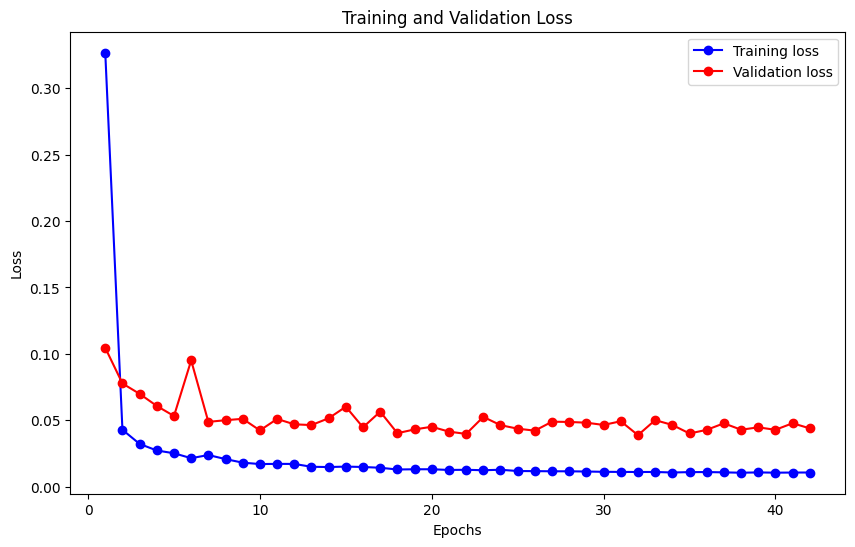

In [ ]:
model_CNN.plot_loss(history_CNN)

### Model Score
#### Scaled data

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_CNN_original)}')

MSE for sales_BEAUTY: 0.07342064425342791
MSE for sales_BEVERAGES: 0.061992533693021816
MSE for sales_BREAD/BAKERY: 0.07146569673554508
MSE for sales_CLEANING: 0.06192772178614334
MSE for sales_DAIRY: 0.07129218409823977
MSE for sales_DELI: 0.062333277197938554
MSE for sales_MEATS: 0.807982095305172
MSE for sales_PERSONAL_CARE: 0.056770231728617136
MSE for sales_POULTRY: 0.1308088901705643
MSE for sales_PREPARED_FOODS: 0.043461702734121234
MSE total: 0.14414549777027919


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_CNN_original, squared=False)}')

RMSE for sales_BEAUTY: 0.27096244066923353
RMSE for sales_BEVERAGES: 0.24898299880317495
RMSE for sales_BREAD/BAKERY: 0.2673306879794108
RMSE for sales_CLEANING: 0.24885281148932864
RMSE for sales_DAIRY: 0.26700596266420673
RMSE for sales_DELI: 0.24966633172684408
RMSE for sales_MEATS: 0.8988782427588132
RMSE for sales_PERSONAL_CARE: 0.2382650451254173
RMSE for sales_POULTRY: 0.36167511688055665
RMSE for sales_PREPARED_FOODS: 0.20847470526210424
RMSE total: 0.32600943433590907


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_CNN_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_CNN_original)}')

MAE for sales_BEAUTY: 0.21619346001992223
MAE for sales_BEVERAGES: 0.19851711002223077
MAE for sales_BREAD/BAKERY: 0.20228383687014345
MAE for sales_CLEANING: 0.1902965363244252
MAE for sales_DAIRY: 0.2011642717944296
MAE for sales_DELI: 0.18616624759999467
MAE for sales_MEATS: 0.8749658028191377
MAE for sales_PERSONAL_CARE: 0.1718421409485562
MAE for sales_POULTRY: 0.3100557224370807
MAE for sales_PREPARED_FOODS: 0.1583500212473021
MAE total: 0.2709835150083223


In [ ]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY_original[:, i], pred_CNN_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_CNN_original)}')

R2 for sales_BEAUTY: -0.09229709128544861
R2 for sales_BEVERAGES: 0.24594246009395082
R2 for sales_BREAD/BAKERY: -0.10226611025611554
R2 for sales_CLEANING: 0.06040653113284389
R2 for sales_DAIRY: -0.046598093366091664
R2 for sales_DELI: 0.10926484284260884
R2 for sales_MEATS: -71.41119531537717
R2 for sales_PERSONAL_CARE: 0.28325847982669183
R2 for sales_POULTRY: -0.676880566818814
R2 for sales_PREPARED_FOODS: -0.059637810349657094
R2 total: -7.169000267355726


#### Unscaled data

In [ ]:
unscaled_CNN = unscale(pred_CNN_original)
originY = unscale(testY_original)

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN)}')

MSE for sales_BEAUTY: 1850227.7524983687
MSE for sales_BEVERAGES: 1562235.1160044952
MSE for sales_BREAD/BAKERY: 1800962.3661274847
MSE for sales_CLEANING: 1560601.7630122334
MSE for sales_DAIRY: 1796589.7907584982
MSE for sales_DELI: 1570822.0369855661
MSE for sales_MEATS: 20361451.90413542
MSE for sales_PERSONAL_CARE: 1430631.1344031761
MSE for sales_POULTRY: 3296433.188532804
MSE for sales_PREPARED_FOODS: 1095251.217984645
MSE total: 3632520.6270442693


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN, squared=False)}')

RMSE for sales_BEAUTY: 1360.2307717804242
RMSE for sales_BEVERAGES: 1249.8940419109515
RMSE for sales_BREAD/BAKERY: 1341.9993912545135
RMSE for sales_CLEANING: 1249.240474453271
RMSE for sales_DAIRY: 1340.3692740280562
RMSE for sales_DELI: 1253.3243941556257
RMSE for sales_MEATS: 4512.366552501628
RMSE for sales_PERSONAL_CARE: 1196.089935750308
RMSE for sales_POULTRY: 1815.6082144925442
RMSE for sales_PREPARED_FOODS: 1046.5425065350403
RMSE total: 1636.5665556862361


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN)}')

MAE for sales_BEAUTY: 1085.2906264617766
MAE for sales_BEVERAGES: 996.5553980888748
MAE for sales_BREAD/BAKERY: 1015.4643559552267
MAE for sales_CLEANING: 955.2881260695441
MAE for sales_DAIRY: 1009.8441438455461
MAE for sales_DELI: 934.5541104107447
MAE for sales_MEATS: 4392.326159180743
MAE for sales_PERSONAL_CARE: 862.647105318439
MAE for sales_POULTRY: 1556.4789707627046
MAE for sales_PREPARED_FOODS: 794.9167099821963
MAE total: 1360.3365706075797


### Plot predict data

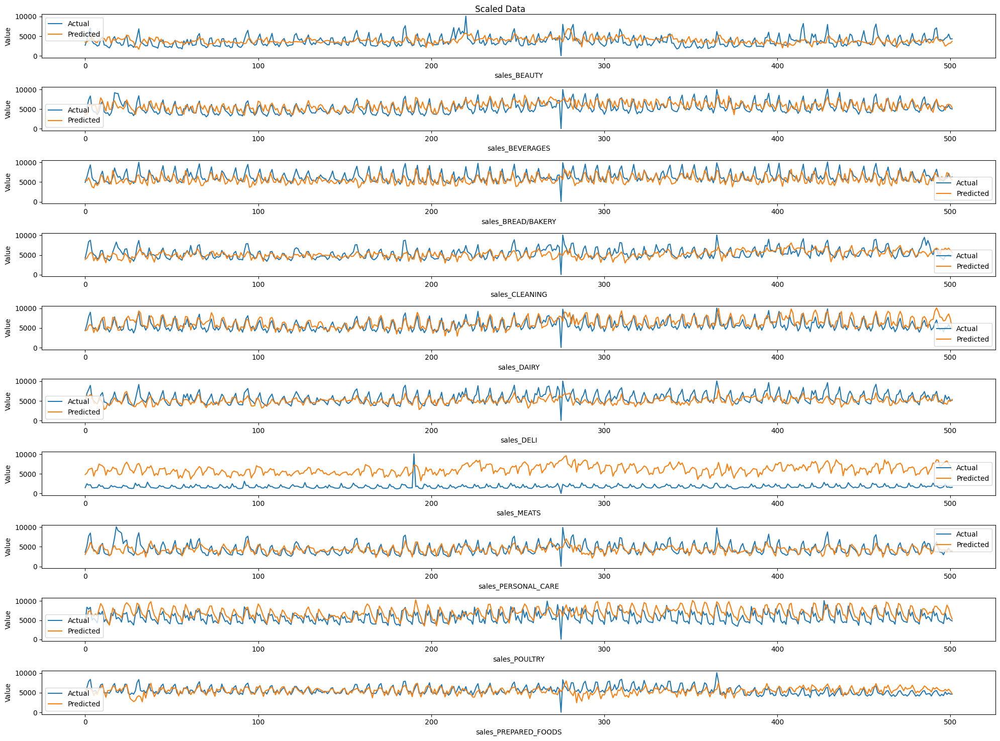

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# LSTM
### Find optimal parameters

In [ ]:
print('Starting find optimal parameters for LSTM model')
def build_lstm_model(n_units, n_past, n_features):
    inputs = tf.keras.layers.Input(shape=(n_past, n_features))
    lstm = tf.keras.layers.LSTM(n_units, return_state=True)
    _, state_h, _ = lstm(inputs)
    outputs = tf.keras.layers.Dense(n_features)(state_h)
    
    model_LSTM = tf.keras.models.Model(inputs, outputs)
    model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_LSTM

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'units': [32, 64, 128]
}

# Lưu tham số và kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_lstm_model(params['units'], p, 10)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0
    )
    
    # Lưu lại kết quả
    loss = history.history['loss'][-1]
    mae = history.history['mae'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'units': params['units'],
        'loss': loss,
        'mae': mae
    })

# Sắp xếp kết quả theo loss
results = sorted(results, key=lambda x: x['loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_LSTM = results[0]

Starting find optimal parameters for LSTM model
Testing with parameters: {'batch_size': 16, 'units': 32}
Testing with parameters: {'batch_size': 16, 'units': 64}
Testing with parameters: {'batch_size': 16, 'units': 128}
Testing with parameters: {'batch_size': 32, 'units': 32}
Testing with parameters: {'batch_size': 32, 'units': 64}
Testing with parameters: {'batch_size': 32, 'units': 128}
Testing with parameters: {'batch_size': 64, 'units': 32}
Testing with parameters: {'batch_size': 64, 'units': 64}
Testing with parameters: {'batch_size': 64, 'units': 128}
Best parameters: {'batch_size': 16, 'units': 128, 'loss': 0.0242591742426157, 'mae': 0.11208654940128326}


### Model initialization

In [ ]:
class LSTM_Model:
    def __init__(self, n_past, n_features, best_para_LSTM, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_LSTM = best_para_LSTM
        self.strategy = strategy

        # Xây dựng mô hình LSTM
        with self.strategy.scope():
            self.model_LSTM = self._build_model()

    def _build_model(self):
        inputs = tf.keras.layers.Input(shape=(self.n_past, self.n_features))
        
        # Lớp LSTM
        lstm = tf.keras.layers.LSTM(self.best_para_LSTM['units'], return_state=True)
        _, state_h, state_c = lstm(inputs)
        
        # Lớp Dense để đưa ra kết quả dự đoán
        outputs = tf.keras.layers.Dense(self.n_features)(state_h)

        # Tạo mô hình
        model = tf.keras.models.Model(inputs, outputs)
        return model

    def train(self, trainX, trainY):
        print('Start training LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        with self.strategy.scope():
            self.model_LSTM.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.Huber())

        start = time.time()
        history_LSTM = self.model_LSTM.fit(
            trainX,
            trainY,
            epochs=50,
            validation_split=0.2,
            batch_size=self.best_para_LSTM['batch_size'],
            verbose=0,
            callbacks=[reduce_lr, early_stopping]
        )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_LSTM

    def summary(self):
        self.model_LSTM.summary()

    def plot_loss(self, history_LSTM):
        loss = history_LSTM.history['loss']
        val_loss = history_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_LSTM.predict(testX)

In [ ]:
lstm_model = LSTM_Model(n_past=p, n_features=10, best_para_LSTM=best_para_LSTM, strategy=strategy)
lstm_model.summary()

Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)     │ (None, 14, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ [(None, 128), (None,   │        71,168 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,458 (283.04 KB)

 Trainable params: 72,458 (283.04 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history = lstm_model.train(trainX, trainY)

Start training LSTM
Complete training model
Training time: 14.81 seconds


In [ ]:
pred_LSTM = lstm_model.predict(testX)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


In [ ]:
last_test_values = scaled_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_LSTM_original = reverse_difference(last_test_values, pred_LSTM)

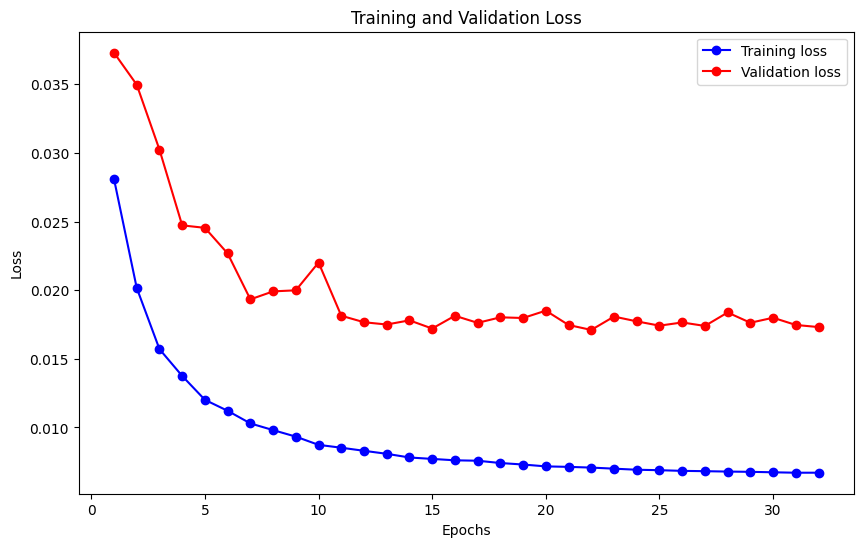

In [ ]:
lstm_model.plot_loss(history)

### Model Score
#### Scaled data

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_LSTM_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_LSTM_original)}')

MSE for sales_BEAUTY: 0.07290203635107682
MSE for sales_BEVERAGES: 0.048661752425054036
MSE for sales_BREAD/BAKERY: 0.043255713933702346
MSE for sales_CLEANING: 0.03922110424739821
MSE for sales_DAIRY: 0.04877108472193175
MSE for sales_DELI: 0.05422069786529923
MSE for sales_MEATS: 0.3185362762311063
MSE for sales_PERSONAL_CARE: 0.10287393241712431
MSE for sales_POULTRY: 0.08230665103942975
MSE for sales_PREPARED_FOODS: 0.025231902047362836
MSE total: 0.08359811512794857


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_LSTM_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_LSTM_original, squared=False)}')

RMSE for sales_BEAUTY: 0.27000377099417855
RMSE for sales_BEVERAGES: 0.22059408973282588
RMSE for sales_BREAD/BAKERY: 0.20798008061759748
RMSE for sales_CLEANING: 0.19804318783386166
RMSE for sales_DAIRY: 0.220841763989359
RMSE for sales_DELI: 0.23285338276542009
RMSE for sales_MEATS: 0.5643901808422134
RMSE for sales_PERSONAL_CARE: 0.3207396645523037
RMSE for sales_POULTRY: 0.28689135755444034
RMSE for sales_PREPARED_FOODS: 0.15884552888691214
RMSE total: 0.2681183007769112


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_LSTM_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_LSTM_original)}')

MAE for sales_BEAUTY: 0.22386419984707184
MAE for sales_BEVERAGES: 0.16476752685349622
MAE for sales_BREAD/BAKERY: 0.1478493841236259
MAE for sales_CLEANING: 0.14978745435677335
MAE for sales_DAIRY: 0.17787776566627647
MAE for sales_DELI: 0.19226171668907313
MAE for sales_MEATS: 0.5597222713405466
MAE for sales_PERSONAL_CARE: 0.2820580302117369
MAE for sales_POULTRY: 0.2469106886620326
MAE for sales_PREPARED_FOODS: 0.12006247946438464
MAE total: 0.22651615172150183


In [ ]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY_original[:, i], pred_LSTM_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_LSTM_original)}')

R2 for sales_BEAUTY: -0.08458163320120149
R2 for sales_BEVERAGES: 0.4080938600952214
R2 for sales_BREAD/BAKERY: 0.33283645550272845
R2 for sales_CLEANING: 0.40492089278086363
R2 for sales_DAIRY: 0.2840207530879928
R2 for sales_DELI: 0.2251926417912139
R2 for sales_MEATS: -27.547157971974343
R2 for sales_PERSONAL_CARE: -0.2988148270969184
R2 for sales_POULTRY: -0.05511501143379727
R2 for sales_PREPARED_FOODS: 0.38482213639931884
R2 total: -2.5945782704048943


#### Unscaled data

In [ ]:
unscaled_LSTM = unscale(pred_LSTM_original)
originY = unscale(testY_original)

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_LSTM)}')

MSE for sales_BEAUTY: 1837158.6205932696
MSE for sales_BEVERAGES: 1226294.406987259
MSE for sales_BREAD/BAKERY: 1090060.2091267472
MSE for sales_CLEANING: 988386.5146792922
MSE for sales_DAIRY: 1229049.6018821967
MSE for sales_DELI: 1366381.907124655
MSE for sales_MEATS: 8027233.414824726
MSE for sales_PERSONAL_CARE: 2592461.599005106
MSE for sales_POULTRY: 2074158.469521374
MSE for sales_PREPARED_FOODS: 635853.407287724
MSE total: 2106703.815103235


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_LSTM, squared=False)}')

RMSE for sales_BEAUTY: 1355.4182456324208
RMSE for sales_BEVERAGES: 1107.3817801405526
RMSE for sales_BREAD/BAKERY: 1044.059485434976
RMSE for sales_CLEANING: 994.1762995964509
RMSE for sales_DAIRY: 1108.625095278921
RMSE for sales_DELI: 1168.92339660247
RMSE for sales_MEATS: 2833.237267654216
RMSE for sales_PERSONAL_CARE: 1610.1122939115476
RMSE for sales_POULTRY: 1440.1938999736717
RMSE for sales_PREPARED_FOODS: 797.4041680902627
RMSE total: 1345.9531932315488


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_LSTM)}')

MAE for sales_BEAUTY: 1123.797724251712
MAE for sales_BEVERAGES: 827.1325836437179
MAE for sales_BREAD/BAKERY: 742.2035337805904
MAE for sales_CLEANING: 751.9326250592856
MAE for sales_DAIRY: 892.9459383805237
MAE for sales_DELI: 965.153328423873
MAE for sales_MEATS: 2809.804373277481
MAE for sales_PERSONAL_CARE: 1415.930590758478
MAE for sales_POULTRY: 1239.491039773158
MAE for sales_PREPARED_FOODS: 602.7133547880977
MAE total: 1137.1105092136913


### Plot predict data

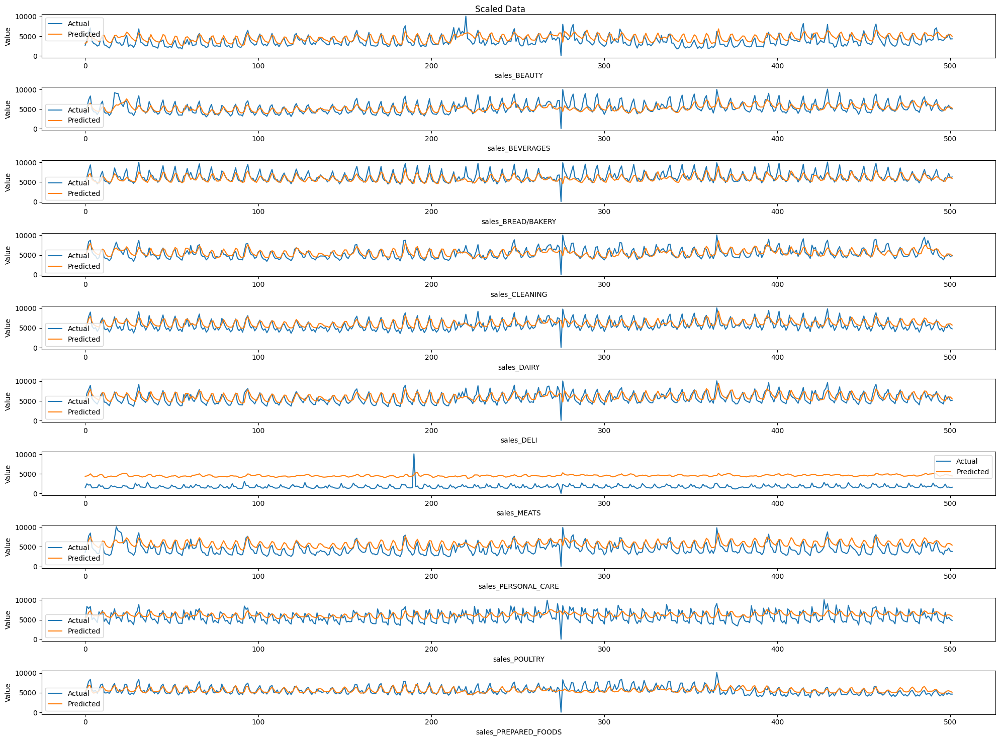

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# CNN + LSTM
### Find optimal parameters

In [ ]:
def build_cnn_lstm_model(filters, kernel_size, lstm_units, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer')
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
    
        conv1 = layers.Conv2D(
            filters=filters,
            kernel_size=(kernel_size, n_features),
            activation='relu',
            padding='same',
            name='conv1')(x)
        conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
    
        conv2 = layers.Conv2D(
            filters=filters,
            kernel_size=(3, 3),
            activation='relu',
            padding='same',
            name='conv2')(pool1)
        conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
    
        flatten = layers.Flatten(name='flatten')(pool2)
    
        lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
    
        lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
        _, state_h, _ = lstm(lstm_input)
        
        outputs = layers.Dense(n_features, name='outputs')(state_h)
        
        model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
        model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
    return model_CNN_LSTM

In [ ]:
print('Starting find optimal parameters for CNN + LSTM model')
# Tập giá trị tham số cần quét
param_grid = {
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10],
    'lstm_units': [32, 64, 128],
    'batch_size': [16, 32, 64]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    cnn_lstm_model = build_cnn_lstm_model(params['filters'], params['kernel_size'], 
                                 params['lstm_units'], p, 10)
    with strategy.scope():
        # Huấn luyện mô hình
        history = cnn_lstm_model.fit(
            trainX, trainY,
            batch_size=params['batch_size'],
            epochs=5,
            verbose=0,
            validation_split=0.2
        )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'lstm_units': params['lstm_units'],
        'batch_size': params['batch_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_cnn_lstm = results[0]

Starting find optimal parameters for CNN + LSTM model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 10, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5, 'lstm_un

### Model initialization

In [ ]:
class CNN_LSTM_Model:
    def __init__(self, n_past, n_features, best_para_cnn_lstm, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_cnn_lstm = best_para_cnn_lstm
        self.strategy = strategy

        # Xây dựng mô hình CNN + LSTM
        with self.strategy.scope():
            self.model_CNN_LSTM = self._build_model()

    def _build_model(self):
        filters = self.best_para_cnn_lstm['filters']
        kernel_size = self.best_para_cnn_lstm['kernel_size']
        lstm_units = self.best_para_cnn_lstm['lstm_units']
        with strategy.scope():
            inputs = layers.Input(shape=(self.n_past, self.n_features), name='input_layer')
            x = layers.Reshape((self.n_past, self.n_features, 1), name='reshape_layer')(inputs)
        
            conv1 = layers.Conv2D(
                filters=filters,
                kernel_size=(kernel_size, self.n_features),
                activation='relu',
                padding='same',
                name='conv1')(x)
            conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
            pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
        
            conv2 = layers.Conv2D(
                filters=filters,
                kernel_size=(3, 3),
                activation='relu',
                padding='same',
                name='conv2')(pool1)
            conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
            pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
        
            flatten = layers.Flatten(name='flatten')(pool2)
        
            lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
        
            lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
            _, state_h, _ = lstm(lstm_input)
            
            outputs = layers.Dense(self.n_features, name='outputs')(state_h)
            
            model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
            model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
            
        return model_CNN_LSTM

    def train(self, trainX, trainY):
        print('Start training CNN + LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():        
            history_CNN_LSTM = self.model_CNN_LSTM.fit(
                trainX,
                trainY,
                epochs=100,
                validation_split=0.2,
                batch_size=self.best_para_cnn_lstm['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stopping]
            )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN_LSTM

    def summary(self):
        self.model_CNN_LSTM.summary()

    def plot_loss(self, history_CNN_LSTM):
        loss = history_CNN_LSTM.history['loss']
        val_loss = history_CNN_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN_LSTM.predict(testX)

In [ ]:
cnn_lstm_model = CNN_LSTM_Model(n_past=p, n_features=10, best_para_cnn_lstm=best_para_cnn_lstm, strategy=strategy)
cnn_lstm_model.summary()

Model: "functional_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 14, 10)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_layer (Reshape)         │ (None, 14, 10, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 14, 10, 16)     │           816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 14, 10, 16)     │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 7, 5, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 7, 5, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_bn (BatchNormalization)   │ (None, 7, 5, 16)       │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 4, 3, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 192)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_input (Reshape)            │ (None, 1, 192)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ [(None, 32), (None,    │        28,800 │
│                                 │ 32), (None, 32)]       │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,394 (126.54 KB)

 Trainable params: 32,330 (126.29 KB)

 Non-trainable params: 64 (256.00 B)

### Model training

In [ ]:
history = cnn_lstm_model.train(trainX, trainY)

Start training CNN + LSTM
Complete training model
Training time: 20.36 seconds


In [ ]:
pred_CNN_LSTM = cnn_lstm_model.predict(testX)

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


In [ ]:
last_test_values = scaled_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_CNN_LSTM_original = reverse_difference(last_test_values, pred_CNN_LSTM)

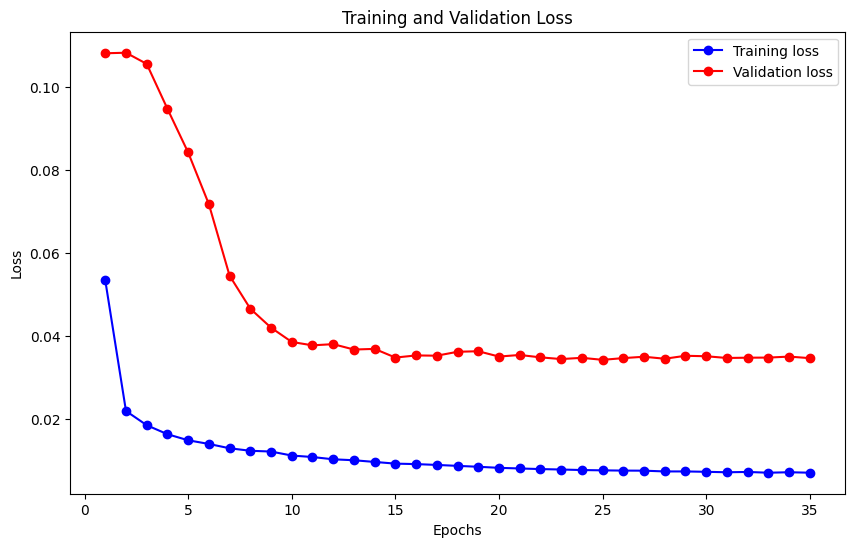

In [ ]:
cnn_lstm_model.plot_loss(history)

### Model Score
#### Scaled data

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_LSTM_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_CNN_LSTM_original)}')

MSE for sales_BEAUTY: 0.06915157991260501
MSE for sales_BEVERAGES: 0.10509001480293825
MSE for sales_BREAD/BAKERY: 0.08270677337962487
MSE for sales_CLEANING: 0.06404541802948438
MSE for sales_DAIRY: 0.04956070663250248
MSE for sales_DELI: 0.09244511542933438
MSE for sales_MEATS: 0.7349981557310038
MSE for sales_PERSONAL_CARE: 0.07304166181307402
MSE for sales_POULTRY: 0.09124668036756046
MSE for sales_PREPARED_FOODS: 0.054177476864609414
MSE total: 0.14164635829627373


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_CNN_LSTM_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_CNN_LSTM_original, squared=False)}')

RMSE for sales_BEAUTY: 0.26296687987768536
RMSE for sales_BEVERAGES: 0.32417590102124844
RMSE for sales_BREAD/BAKERY: 0.2875878533242057
RMSE for sales_CLEANING: 0.25307196215599304
RMSE for sales_DAIRY: 0.2226223408207327
RMSE for sales_DELI: 0.3040478834482069
RMSE for sales_MEATS: 0.8573203343739164
RMSE for sales_PERSONAL_CARE: 0.27026220936911255
RMSE for sales_POULTRY: 0.3020706545951799
RMSE for sales_PREPARED_FOODS: 0.23276055693482392
RMSE total: 0.3316886575921105


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_CNN_LSTM_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_CNN_LSTM_original)}')

MAE for sales_BEAUTY: 0.19076435812891854
MAE for sales_BEVERAGES: 0.24291209278853312
MAE for sales_BREAD/BAKERY: 0.22538356714978378
MAE for sales_CLEANING: 0.20102599332097387
MAE for sales_DAIRY: 0.17042063909460847
MAE for sales_DELI: 0.22730441237971427
MAE for sales_MEATS: 0.8516212045353023
MAE for sales_PERSONAL_CARE: 0.1990283156553962
MAE for sales_POULTRY: 0.2154843442416753
MAE for sales_PREPARED_FOODS: 0.18724738313447464
MAE total: 0.27111923104293806


In [ ]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY_original[:, i], pred_CNN_LSTM_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_CNN_LSTM_original)}')

R2 for sales_BEAUTY: -0.028785164777481942
R2 for sales_BEVERAGES: -0.2782816463575839
R2 for sales_BREAD/BAKERY: -0.2756452053121907
R2 for sales_CLEANING: 0.028275952098157475
R2 for sales_DAIRY: 0.2724287841150038
R2 for sales_DELI: -0.32102976326591337
R2 for sales_MEATS: -64.8703891092759
R2 for sales_PERSONAL_CARE: 0.07782670371772693
R2 for sales_POULTRY: -0.16972007709550518
R2 for sales_PREPARED_FOODS: -0.3208986151850244
R2 total: -6.588621814133873


#### Unscaled data

In [ ]:
unscaled_CNN_LSTM = unscale(pred_CNN_LSTM_original)
originY = unscale(testY_original)

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN_LSTM)}')

MSE for sales_BEAUTY: 1742645.7327476956
MSE for sales_BEVERAGES: 2648307.8317477084
MSE for sales_BREAD/BAKERY: 2084241.7480918702
MSE for sales_CLEANING: 1613968.5622139622
MSE for sales_DAIRY: 1248948.398956324
MSE for sales_DELI: 2329651.605280267
MSE for sales_MEATS: 18522229.049323753
MSE for sales_PERSONAL_CARE: 1840677.27051438
MSE for sales_POULTRY: 2299450.601175465
MSE for sales_PREPARED_FOODS: 1365292.7251466073
MSE total: 3569541.3525198037


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN_LSTM, squared=False)}')

RMSE for sales_BEAUTY: 1320.0930773046632
RMSE for sales_BEVERAGES: 1627.362231264972
RMSE for sales_BREAD/BAKERY: 1443.6903227811254
RMSE for sales_CLEANING: 1270.4206241296472
RMSE for sales_DAIRY: 1117.5635995129423
RMSE for sales_DELI: 1526.319627496242
RMSE for sales_MEATS: 4303.745932245973
RMSE for sales_PERSONAL_CARE: 1356.7156188805302
RMSE for sales_POULTRY: 1516.3939465638423
RMSE for sales_PREPARED_FOODS: 1168.457412637109
RMSE total: 1665.0762392817046


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN_LSTM)}')

MAE for sales_BEAUTY: 957.6365960701108
MAE for sales_BEVERAGES: 1219.4181108180605
MAE for sales_BREAD/BAKERY: 1131.424957766212
MAE for sales_CLEANING: 1009.1499953129384
MAE for sales_DAIRY: 855.5111826777651
MAE for sales_DELI: 1141.0675887427005
MAE for sales_MEATS: 4275.1363155280105
MAE for sales_PERSONAL_CARE: 999.1216515549721
MAE for sales_POULTRY: 1081.730871996649
MAE for sales_PREPARED_FOODS: 939.9813897735309
MAE total: 1361.0178660240954


### Plot predict data

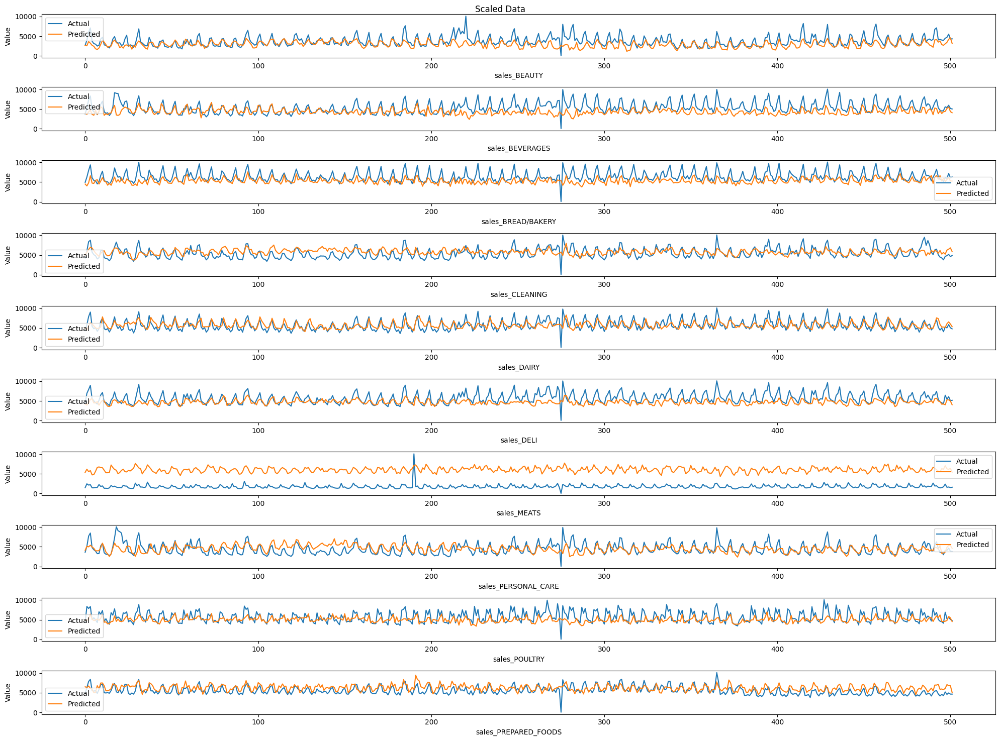

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

## VAR-NN
### Define model

In [ ]:
var_model = VAR(VAR_train_diff)
var_results = var_model.fit(p)
var_coefficients = var_results.params

In [ ]:
class VARNN(tf.keras.Model):
    def __init__(self, var_weights, var_bias, hidden_units):
        super(VARNN, self).__init__()
        self.ffnn_model = tf.keras.Sequential([
            tf.keras.layers.Flatten(input_shape=(p, 10)),  
            tf.keras.layers.Dense(hidden_units, activation='sigmoid')
        ])
        self.var_weights = tf.cast(var_weights, tf.float32)
        self.var_bias = tf.cast(var_bias, tf.float32)
        self.hidden_units = hidden_units

    def call(self, inputs):
        ffnn_output = self.ffnn_model(inputs)
        ffnn_output = tf.reshape(ffnn_output, [-1, self.hidden_units])
        var_output = tf.matmul(ffnn_output, self.var_weights) + self.var_bias
        return var_output

In [ ]:
num_outputs = 10
var_bias = var_coefficients.loc['const'].values
var_weights = var_coefficients.drop('const').values

In [ ]:
VARNN_model = VARNN(var_weights, var_bias, num_outputs * p)
start = time.time()
VARNN_model.compile(optimizer='adam', loss='mse')
history = VARNN_model.fit(trainX, trainY, verbose=0, epochs=100, batch_size=32, validation_split=0.2)
end = time.time()

In [ ]:
print(end-start)

10.61382007598877


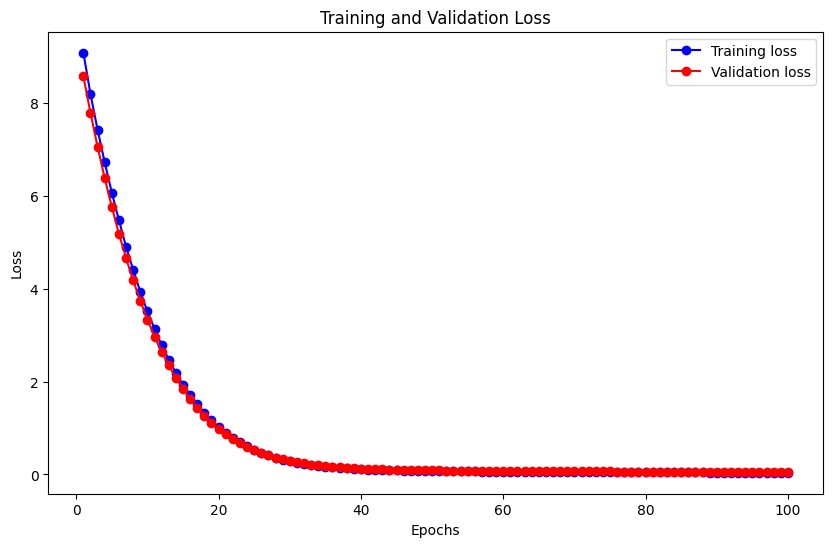

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
def reverse_difference(original_data, differenced_data, order=1):
    reversed_data = []
    last_original_value = original_data.iloc[-len(differenced_data) - order:-order].values
    for i in range(len(differenced_data)):
        restored = differenced_data[i] + last_original_value[i]
        reversed_data.append(restored)
    return np.array(reversed_data)

In [ ]:
# Get predictions
pred_VARNN = VARNN_model.predict(testX)

# Reverse the differencing
last_test_values = scaled_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_VARNN_original = reverse_difference(last_test_values, pred_VARNN)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


### Model Evaluation
#### Scaled data


In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_VARNN_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_VARNN_original)}')

MSE for sales_BEAUTY: 0.049094925390071535
MSE for sales_BEVERAGES: 0.03765336972797979
MSE for sales_BREAD/BAKERY: 0.029291194549180277
MSE for sales_CLEANING: 0.045851069465115746
MSE for sales_DAIRY: 0.08855039835107367
MSE for sales_DELI: 0.04439075578670398
MSE for sales_MEATS: 0.3327501697066438
MSE for sales_PERSONAL_CARE: 0.2232856406877582
MSE for sales_POULTRY: 0.0394389499197414
MSE for sales_PREPARED_FOODS: 0.045904362802737304
MSE total: 0.0936210836387006


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_VARNN_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_VARNN_original, squared=False)}')

RMSE for sales_BEAUTY: 0.22157374706871646
RMSE for sales_BEVERAGES: 0.19404476217610148
RMSE for sales_BREAD/BAKERY: 0.1711467047570016
RMSE for sales_CLEANING: 0.21412862831745724
RMSE for sales_DAIRY: 0.2975741896587701
RMSE for sales_DELI: 0.2106911383677633
RMSE for sales_MEATS: 0.5768450135925973
RMSE for sales_PERSONAL_CARE: 0.472531100233369
RMSE for sales_POULTRY: 0.19859242160702256
RMSE for sales_PREPARED_FOODS: 0.21425303452398825
RMSE total: 0.27713807403027874


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_VARNN_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_VARNN_original)}')

MAE for sales_BEAUTY: 0.15746355271032914
MAE for sales_BEVERAGES: 0.14210184611409732
MAE for sales_BREAD/BAKERY: 0.1261796743639411
MAE for sales_CLEANING: 0.14932877884129958
MAE for sales_DAIRY: 0.25689286110099413
MAE for sales_DELI: 0.14688071563404517
MAE for sales_MEATS: 0.20286253411062183
MAE for sales_PERSONAL_CARE: 0.42499998363741665
MAE for sales_POULTRY: 0.14390987472045308
MAE for sales_PREPARED_FOODS: 0.13893506137548337
MAE total: 0.18895548826086814


In [ ]:
for i in range(10):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY_original[:, i], pred_VARNN_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_VARNN_original)}')

R2 for sales_BEAUTY: 0.6184535608306727
R2 for sales_BEVERAGES: 0.594497275740907
R2 for sales_BREAD/BAKERY: 0.520752531966811
R2 for sales_CLEANING: 0.40803303184741335
R2 for sales_DAIRY: 0.10250096443899581
R2 for sales_DELI: 0.360121278196573
R2 for sales_MEATS: -0.34168968304353653
R2 for sales_PERSONAL_CARE: -1.02685099878738
R2 for sales_POULTRY: 0.19436553251929745
R2 for sales_PREPARED_FOODS: 0.0020411592604293594
R2 total: 0.14322246529701804


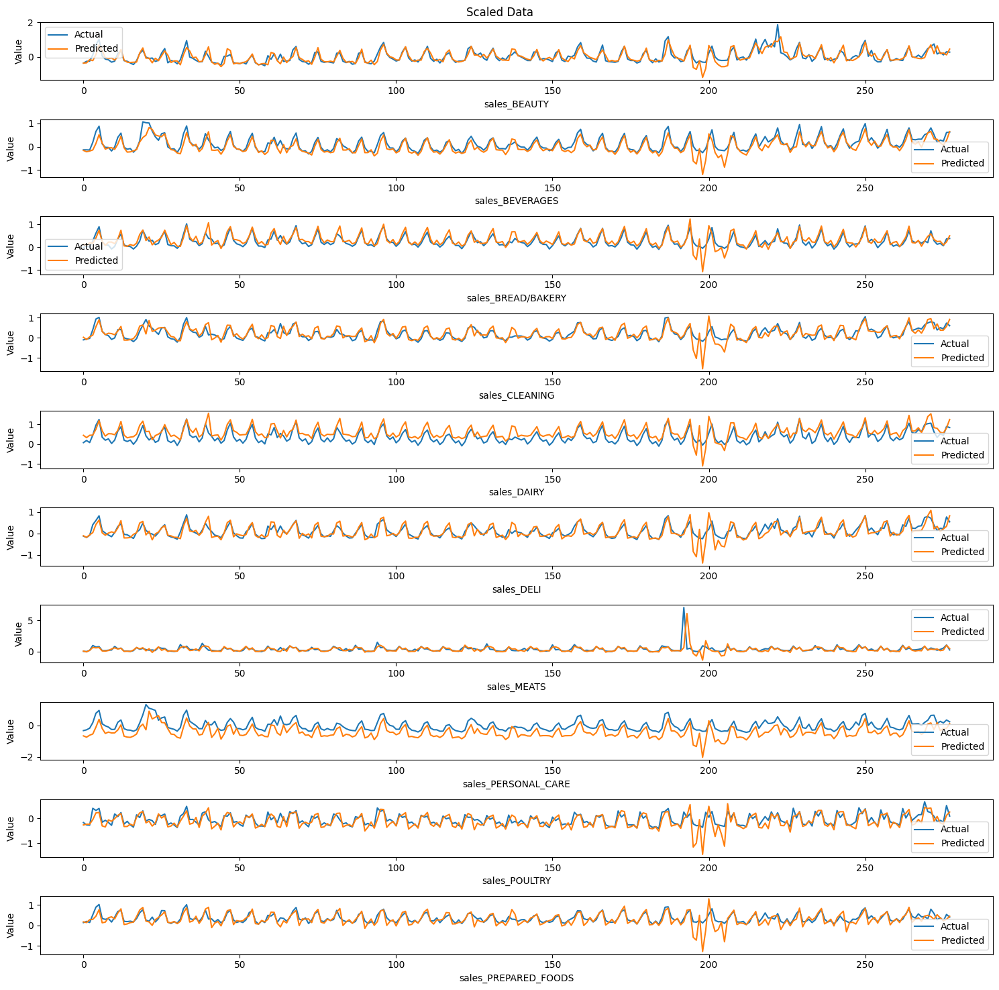

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(testY_original[:, i], label='Actual')
    plt.plot(pred_VARNN_original[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

In [ ]:
unscaled_VARNN = unscale(pred_VARNN_original)
originY = unscale(testY_original)

In [ ]:
for i in range(10):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_VARNN)}')

MSE for sales_BEAUTY: 3726.317110837777
MSE for sales_BEVERAGES: 838002728.421393
MSE for sales_BREAD/BAKERY: 15104056.841385776
MSE for sales_CLEANING: 124181650.18638308
MSE for sales_DAIRY: 103051853.98283567
MSE for sales_DELI: 8920862.434957234
MSE for sales_MEATS: 66839046.72798877
MSE for sales_PERSONAL_CARE: 63840553.41486474
MSE for sales_POULTRY: 18821987.775523804
MSE for sales_PREPARED_FOODS: 779081.3844206303
MSE total: 123954554.7486864


In [ ]:
for i in range(10):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_VARNN, squared=False)}')

RMSE for sales_BEAUTY: 61.04356731743138
RMSE for sales_BEVERAGES: 28948.276778098432
RMSE for sales_BREAD/BAKERY: 3886.393809354088
RMSE for sales_CLEANING: 11143.682074897106
RMSE for sales_DAIRY: 10151.445906019284
RMSE for sales_DELI: 2986.781283414846
RMSE for sales_MEATS: 8175.515074170481
RMSE for sales_PERSONAL_CARE: 7990.028373846037
RMSE for sales_POULTRY: 4338.431487937064
RMSE for sales_PREPARED_FOODS: 882.6558697593475
RMSE total: 7856.425422481412


In [ ]:
for i in range(10):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_VARNN)}')

MAE for sales_BEAUTY: 43.38120877169568
MAE for sales_BEVERAGES: 21199.250759762435
MAE for sales_BREAD/BAKERY: 2865.283944616958
MAE for sales_CLEANING: 7771.368308458915
MAE for sales_DAIRY: 8763.643063599315
MAE for sales_DELI: 2082.1975511119435
MAE for sales_MEATS: 2875.132256542567
MAE for sales_PERSONAL_CARE: 7186.324723325079
MAE for sales_POULTRY: 3143.8416776434233
MAE for sales_PREPARED_FOODS: 572.3692442018387
MAE total: 5650.279273803417


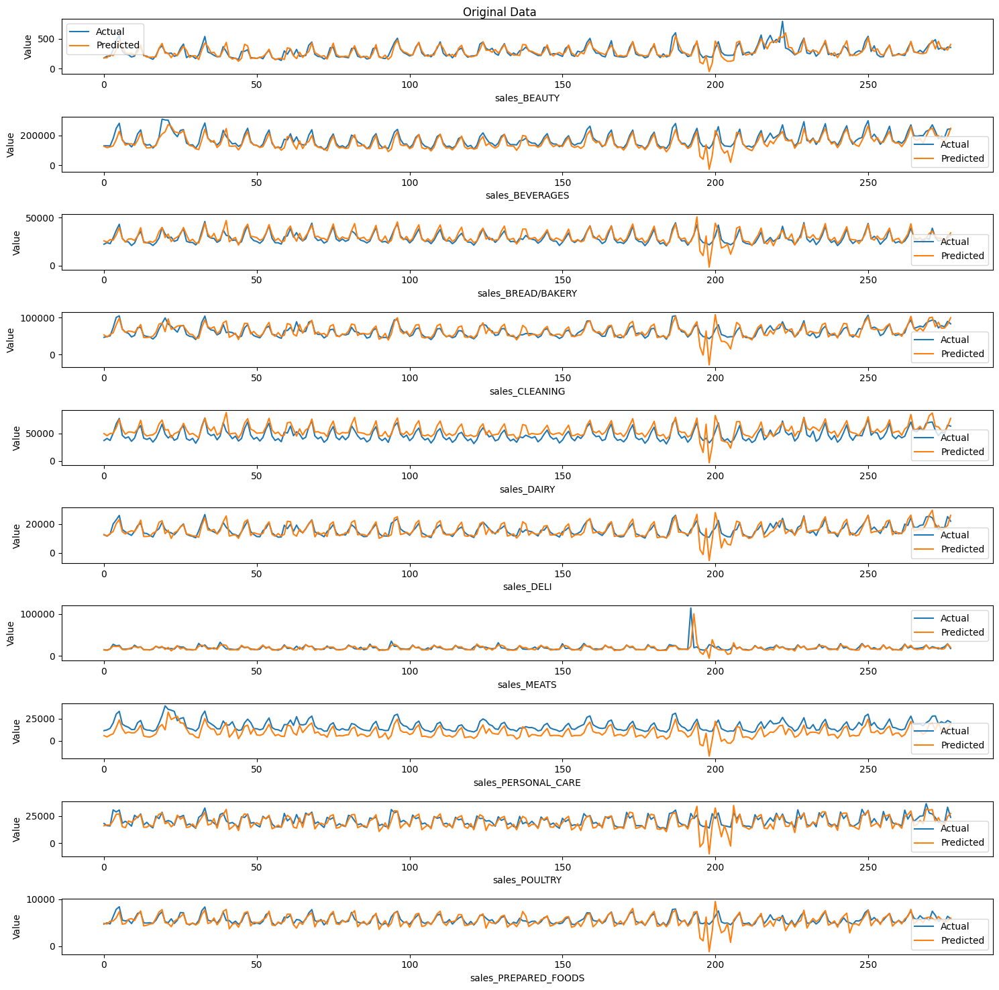

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(10):
    plt.subplot(10, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## SrVAR
### Define model

In [ ]:
class LSTMEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(LSTMEncoder, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)

    def forward(self, x):
        _, (h_n, _) = self.lstm(x)
        return h_n[-1] 

In [ ]:
class StateRegularizedUnit(nn.Module):
    def __init__(self, hidden_dim, num_states, tau=1.0):
        super(StateRegularizedUnit, self).__init__()
        self.state_encodings = nn.Parameter(torch.randn(num_states, hidden_dim))
        self.tau = tau

    def forward(self, u_t):
        # Proximity scores
        proximity_scores = torch.matmul(u_t, self.state_encodings.T)
        alpha = torch.softmax(proximity_scores / self.tau, dim=-1) 

        h_t = torch.matmul(alpha, self.state_encodings)  

        # Tính entropy regularization
        entropy_reg = -torch.sum(alpha * torch.log(alpha + 1e-10), dim=-1).mean()

        return h_t, alpha, entropy_reg

In [ ]:
class GraphGeneration(nn.Module):
    def __init__(self, hidden_dim, num_vars):
        super(GraphGeneration, self).__init__()
        self.g_a = nn.Linear(hidden_dim, num_vars * num_vars)
        self.g_d = nn.Linear(hidden_dim, num_vars)

    def forward(self, c_st):
        A_st = self.g_a(c_st).view(-1, num_vars, num_vars)

        D_st = torch.diag_embed(self.g_d(c_st))

        # Ràng buộc tính không chu kỳ (Acyclicity constraint)
        exp_A = torch.matrix_exp(A_st * A_st)  
        trace_exp_A = torch.sum(torch.diagonal(exp_A, dim1=-2, dim2=-1), dim=-1)
        acyclic_penalty = torch.mean(trace_exp_A - A_st.size(-1))

        return A_st, D_st, acyclic_penalty

In [ ]:
class DynamicVAR(nn.Module):
    def __init__(self, num_vars):
        super(DynamicVAR, self).__init__()
        self.var_weights = nn.Parameter(torch.randn(num_vars, num_vars))

    def forward(self, x_t, A_st, D_st):
        batch_size = x_t.size(0)
        x_t = x_t.unsqueeze(-1)

        x_hat_A = torch.matmul(A_st, x_t).squeeze(-1)

        weighted_x_t = torch.matmul(self.var_weights, x_t.squeeze(-1).unsqueeze(-1)).squeeze(-1)
        x_hat_D = torch.matmul(D_st, weighted_x_t.unsqueeze(-1)).squeeze(-1)

        x_hat = x_hat_A + x_hat_D
        return x_hat

In [ ]:
class SrVARModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_states, num_vars, tau=10.0):
        super(SrVARModel, self).__init__()
        self.encoder = LSTMEncoder(input_dim, hidden_dim)
        self.state_regularized_unit = StateRegularizedUnit(hidden_dim, num_states, tau)
        self.graph_generation = GraphGeneration(hidden_dim, num_vars)
        self.dynamic_var = DynamicVAR(num_vars)

    def forward(self, x):
        u_t = self.encoder(x)
        h_t, alpha, entropy_reg = self.state_regularized_unit(u_t)
        A_st, D_st, acyclic_penalty = self.graph_generation(h_t)
        x_hat = self.dynamic_var(x[:, -1, :], A_st, D_st)

        return x_hat, alpha, entropy_reg, acyclic_penalty

In [ ]:
def train_srvarm(model, trainX, trainY, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0):

    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    # Lagrangian parameters
    rho = 1.0
    lagrangian_multiplier = 0.0
    max_rho = 10.0

    train_loss_history = []
    val_loss_history = []

    for epoch in range(num_epochs):
        model.train()
        train_epoch_loss = 0

        for i in range(0, len(trainX), batch_size):
            batch_x = torch.tensor(trainX[i:i + batch_size], dtype=torch.float32)
            batch_y = torch.tensor(trainY[i:i + batch_size], dtype=torch.float32)

            x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_x)

            loss = (
                mse_loss(x_hat, batch_y)
                + 0.01 * entropy_reg
                + rho / 2 * acyclic_penalty.pow(2).mean()
                + lagrangian_multiplier * acyclic_penalty.mean()
            )

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_epoch_loss += loss.item()

        train_avg_loss = train_epoch_loss / (len(trainX) / batch_size)
        train_loss_history.append(train_avg_loss)

        model.eval()
        val_epoch_loss = 0
        with torch.no_grad():
            for i in range(0, len(valX), batch_size):
                batch_val_x = torch.tensor(valX[i:i + batch_size], dtype=torch.float32)
                batch_val_y = torch.tensor(valY[i:i + batch_size], dtype=torch.float32)

                x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_val_x)

                val_loss = mse_loss(x_hat, batch_val_y) + 0.01 * entropy_reg
                val_epoch_loss += val_loss.item()

        val_avg_loss = val_epoch_loss / (len(valX) / batch_size)
        val_loss_history.append(val_avg_loss)

        if verbose == 1:
            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_avg_loss:.4f}, Val Loss: {val_avg_loss:.4f}")

    return model, train_loss_history, val_loss_history

In [ ]:
Xtrain, valX, Ytrain, valY = train_test_split(trainX, trainY, test_size=0.2, random_state=42)

input_dim = trainX.shape[2]
hidden_dim = 64
num_vars = trainX.shape[2]

for num_states in range(1, 6):
    model = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)
    trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
        model, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0
    )

    print(f"num_states: {num_states}, train_loss: {train_loss_history_SrVAR[-1]}, val_loss: {val_loss_history_SrVAR[-1]}")

num_states: 1, train_loss: 0.05324042108467499, val_loss: 0.046416593578470736
num_states: 2, train_loss: 0.026185878962601602, val_loss: 0.03080362623388117
num_states: 3, train_loss: 0.026071182623861152, val_loss: 0.031233019126958146
num_states: 4, train_loss: 0.027151960936130516, val_loss: 0.031434904703330165
num_states: 5, train_loss: 0.02380508998986697, val_loss: 0.02787332230316096


In [ ]:
# Model parameters
num_states = 5

# Instantiate the model
model_SrVAR = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)

start = time.time()
trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
    model_SrVAR, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.01, tau=1.0, verbose=1
)
end = time.time()

# Log training time
print(f"Training completed in {end - start:.2f} seconds")

Epoch 10/100, Train Loss: 0.0400, Val Loss: 0.0388
Epoch 20/100, Train Loss: 0.0351, Val Loss: 0.0400
Epoch 30/100, Train Loss: 0.0271, Val Loss: 0.0348
Epoch 40/100, Train Loss: 0.0263, Val Loss: 0.0337
Epoch 50/100, Train Loss: 0.0252, Val Loss: 0.0326
Epoch 60/100, Train Loss: 0.0238, Val Loss: 0.0325
Epoch 70/100, Train Loss: 0.0287, Val Loss: 0.0313
Epoch 80/100, Train Loss: 0.0210, Val Loss: 0.0303
Epoch 90/100, Train Loss: 0.0211, Val Loss: 0.0290
Epoch 100/100, Train Loss: 0.0204, Val Loss: 0.0289
Training completed in 24.19 seconds


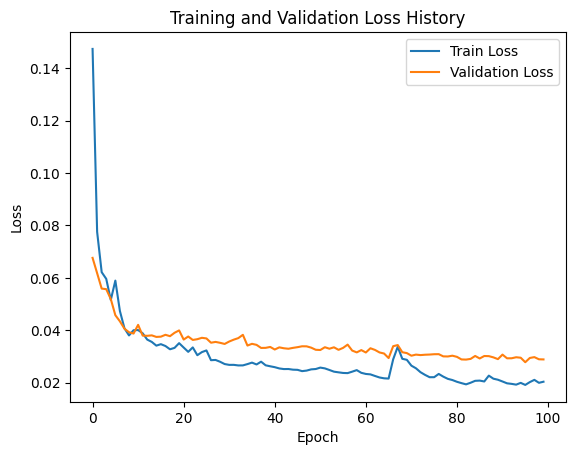

In [ ]:
plt.plot(train_loss_history_SrVAR, label="Train Loss")
plt.plot(val_loss_history_SrVAR, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss History")
plt.legend()
plt.show()

In [ ]:
model_SrVAR.eval() 
predictions_SrVAR = []
batch_size = 32
n_features = 10

with torch.no_grad():
    for i in range(0, len(testX), batch_size):
        batch_x = torch.tensor(testX[i:i+batch_size], dtype=torch.float32)

        batch_pred, _, _, _ = model_SrVAR(batch_x)

        predictions_SrVAR.append(batch_pred.cpu().numpy())

predictions_SrVAR = np.concatenate(predictions_SrVAR, axis=0)

In [ ]:
last_test_values = scaled_test.iloc[p:]
testY_original = reverse_difference(last_test_values, testY)
pred_SrVAR_original = reverse_difference(last_test_values, predictions_SrVAR)

### Model Evaluation
#### Scaled data


In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_SrVAR_original[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY_original, pred_SrVAR_original)}')

MSE for sales_BEAUTY: 0.04827558265866426
MSE for sales_BEVERAGES: 0.027898377996398587
MSE for sales_BREAD/BAKERY: 0.03149702864745186
MSE for sales_CLEANING: 0.030252802429689
MSE for sales_DAIRY: 0.03419677188986793
MSE for sales_DELI: 0.034356403779518215
MSE for sales_MEATS: 0.305196521102792
MSE for sales_PERSONAL_CARE: 0.05118240778430736
MSE for sales_POULTRY: 0.02835009352281981
MSE for sales_PREPARED_FOODS: 0.06497105988604458
MSE total: 0.06561770496975534


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY_original[:, i], pred_SrVAR_original[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY_original, pred_SrVAR_original, squared=False)}')

RMSE for sales_BEAUTY: 0.21971705136075412
RMSE for sales_BEVERAGES: 0.167028075473552
RMSE for sales_BREAD/BAKERY: 0.1774740224580822
RMSE for sales_CLEANING: 0.17393332754158702
RMSE for sales_DAIRY: 0.184923692072887
RMSE for sales_DELI: 0.18535480511580543
RMSE for sales_MEATS: 0.5524459440549745
RMSE for sales_PERSONAL_CARE: 0.22623529296797917
RMSE for sales_POULTRY: 0.16837486012709799
RMSE for sales_PREPARED_FOODS: 0.25489421312780836
RMSE total: 0.23103812843005275


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY_original[:, i], pred_SrVAR_original[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY_original, pred_SrVAR_original)}')

MAE for sales_BEAUTY: 0.15952628702468707
MAE for sales_BEVERAGES: 0.11559512703158718
MAE for sales_BREAD/BAKERY: 0.12635412589701717
MAE for sales_CLEANING: 0.12633108153986652
MAE for sales_DAIRY: 0.13653552535956534
MAE for sales_DELI: 0.13472198924202897
MAE for sales_MEATS: 0.2229924762177602
MAE for sales_PERSONAL_CARE: 0.15749942295925948
MAE for sales_POULTRY: 0.12619852717383992
MAE for sales_PREPARED_FOODS: 0.14492050943778803
MAE total: 0.14506750718834


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY_original[:, i], pred_SrVAR_original[:, i])}')
    
print(f'R2 total: {r2_score(testY_original, pred_SrVAR_original)}')

R2 for sales_BEAUTY: 0.6248211700926054
R2 for sales_BEVERAGES: 0.6995523013829197
R2 for sales_BREAD/BAKERY: 0.48466180836306805
R2 for sales_CLEANING: 0.6094167498961522
R2 for sales_DAIRY: 0.6533999805537409
R2 for sales_DELI: 0.5047632925685572
R2 for sales_MEATS: -0.23058997693493666
R2 for sales_PERSONAL_CARE: 0.5353972874456592
R2 for sales_POULTRY: 0.4208818301510494
R2 for sales_PREPARED_FOODS: -0.4124680018787217
R2 total: 0.3889836441640092


#### Unscaled data


In [ ]:
unscaled_SrVAR = unscale(pred_SrVAR_original)
originY = unscale(testY_original)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_SrVAR)}')

MSE for sales_BEAUTY: 3664.128792688282
MSE for sales_BEVERAGES: 620898396.3031807
MSE for sales_BREAD/BAKERY: 16241499.1381491
MSE for sales_CLEANING: 81935775.37683542
MSE for sales_DAIRY: 39797006.10162506
MSE for sales_DELI: 6904337.320806037
MSE for sales_MEATS: 61304385.06821244
MSE for sales_PERSONAL_CARE: 14633781.321499042
MSE for sales_POULTRY: 13529901.653247919
MSE for sales_PREPARED_FOODS: 1102678.2683121557
MSE total: 85635142.46806602


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_SrVAR, squared=False)}')

RMSE for sales_BEAUTY: 60.53204764988776
RMSE for sales_BEVERAGES: 24917.832897408647
RMSE for sales_BREAD/BAKERY: 4030.0743340724002
RMSE for sales_CLEANING: 9051.838231919273
RMSE for sales_DAIRY: 6308.486831374467
RMSE for sales_DELI: 2627.6105725175557
RMSE for sales_MEATS: 7829.711684871445
RMSE for sales_PERSONAL_CARE: 3825.4125687955598
RMSE for sales_POULTRY: 3678.3014630734006
RMSE for sales_PREPARED_FOODS: 1050.0848862411817
RMSE total: 6337.988551792381


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_SrVAR)}')

MAE for sales_BEAUTY: 43.94949207530129
MAE for sales_BEVERAGES: 17244.885633516787
MAE for sales_BREAD/BAKERY: 2869.245384360374
MAE for sales_CLEANING: 6574.522145497734
MAE for sales_DAIRY: 4657.772912116212
MAE for sales_DELI: 1909.8340777396224
MAE for sales_MEATS: 3160.4301117049586
MAE for sales_PERSONAL_CARE: 2663.157742818118
MAE for sales_POULTRY: 2756.9212339113133
MAE for sales_PREPARED_FOODS: 597.0274287501719
MAE total: 4247.774616249059


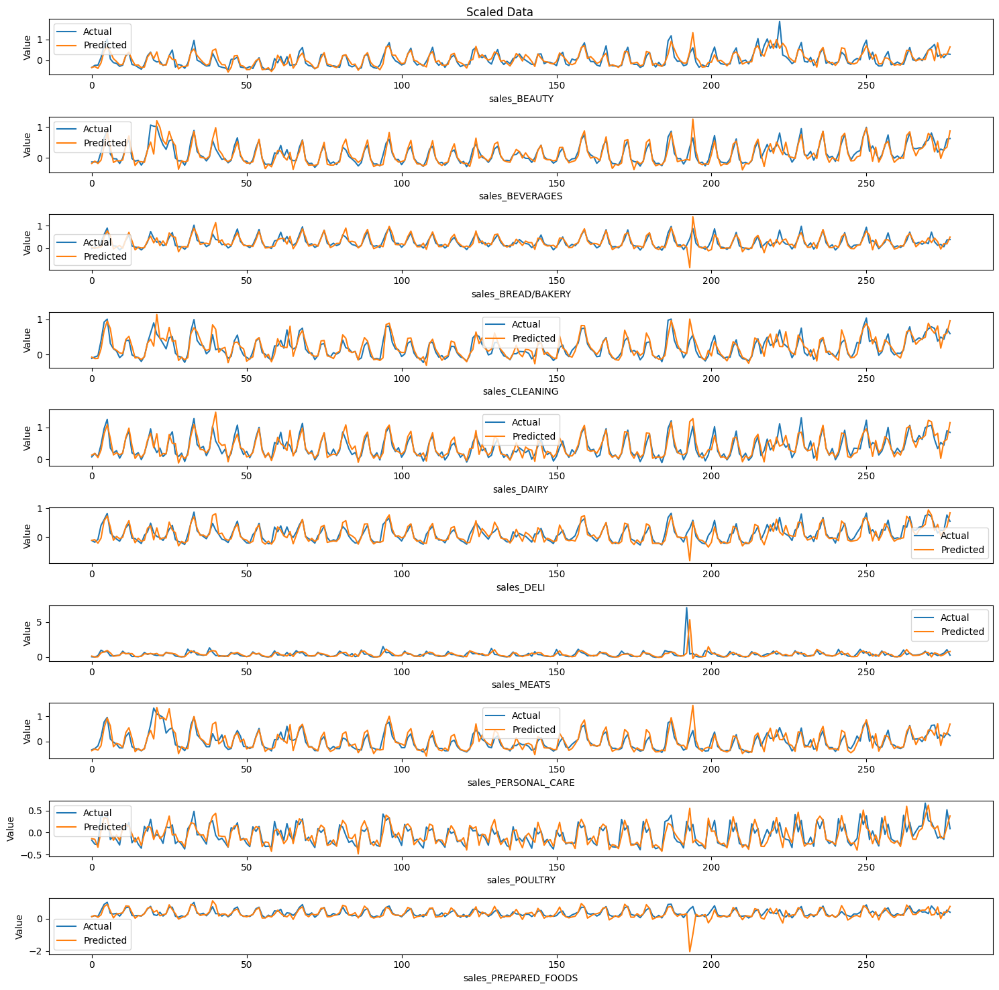

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(testY_original[:, i], label='Actual')
    plt.plot(pred_SrVAR_original[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

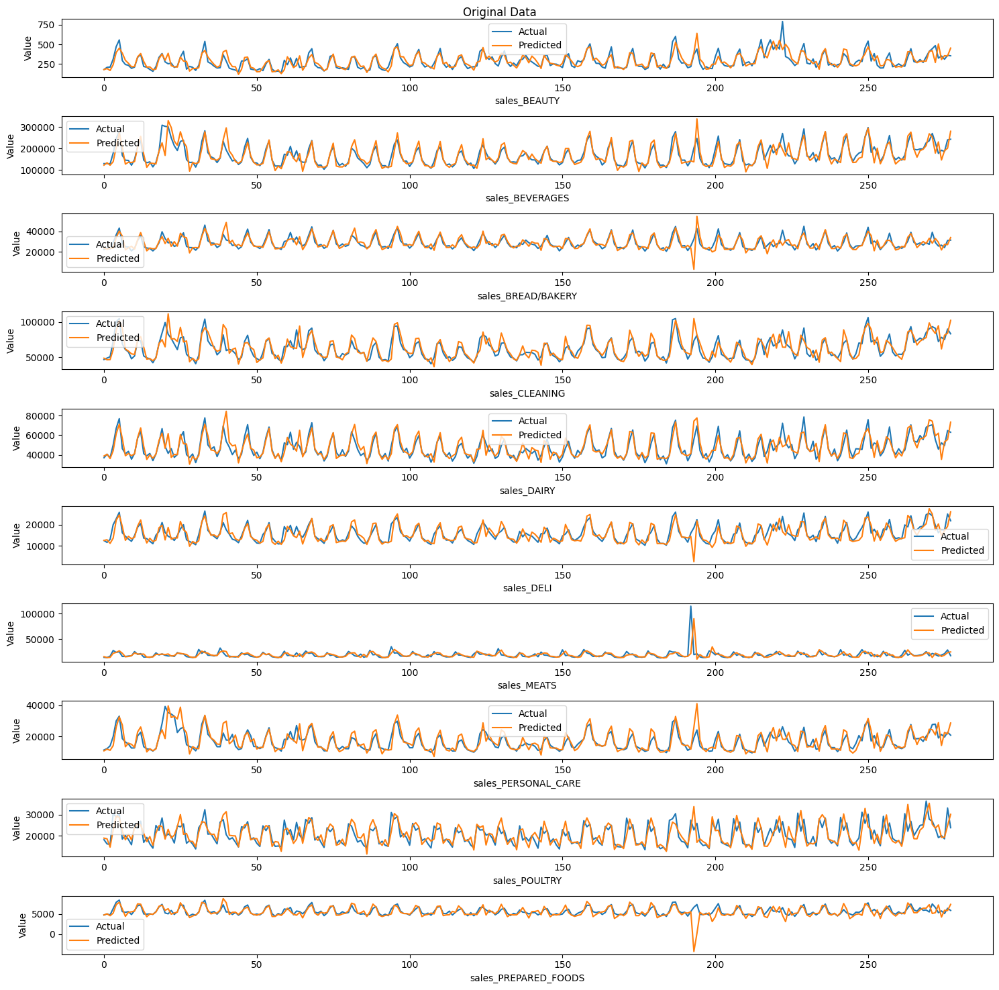

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

In [ ]:
torch.save(trained_model_SrVAR.state_dict(), "srvar_model_newstore.pth")